In [1]:
import pandas as pd
import numpy as np
import pyaf.ForecastEngine as autof
import sys, datetime

%matplotlib inline  

In [2]:
lTimeVar, lSignalVar = "Time", "Temperature"

def get_dataset():
    # thanks to facebook/prophet.
    # Temperature every 5 minutes from 2017-05-01 00:00:00 to 2017-07-05 00:00:00
    # 18722 observations
    # Missing data around : 11689 2017-06-10 14:05:00          NaN

    uri = "https://raw.githubusercontent.com/facebook/prophet/main/examples/example_yosemite_temps.csv"
    df = pd.read_csv(uri)
    df.columns = [lTimeVar, lSignalVar]
    df[lTimeVar] = df[lTimeVar].apply(datetime.datetime.fromisoformat)
    N = df.shape[0];
    print(df.head())
    print(df[df.Temperature.isnull()].head())
    print(df.info())
    print(df.describe())
    sys.stdout.flush()
    K = 1000
    df_train = df[0:N-K]

    return  df_train



In [3]:
def buildModel(H):

    lEngine = autof.cForecastEngine()
    lEngine

    # lEngine.mOptions.enable_slow_mode();
    # lEngine.mOptions.mDebug = True;
    # lEngine.mOptions.mDebugPerformance = True;
    lEngine.mOptions.mParallelMode = True
    lEngine.mOptions.mMissingDataOptions.mSignalMissingDataImputation = "PreviousValue"
    
    lEngine.train(df_train , lTimeVar , lSignalVar, H);
    lEngine.getModelInfo();
    print(lEngine.mSignalDecomposition.mModelShortList.head());
        
    lEngine.standardPlots();
    print("\n\n<ModelInfo>")
    print(lEngine.to_json());
    print("</ModelInfo>\n\n")
    return lEngine

In [4]:
def apply_and_plot_model(iEngine, df_train, H):
    dfapp_in = df_train.copy();
    dfapp_in.tail()
    
    #H = 12
    dfapp_out = iEngine.forecast(dfapp_in, H);
    #dfapp_out.to_csv("outputs/ozone_apply_out.csv")
    print("Forecast Columns " , dfapp_out.columns);
    dfapp_out.plot.line(lTimeVar, [lSignalVar , lSignalVar + '_Forecast', 
                                  lSignalVar + '_Forecast_Lower_Bound', 
                                  lSignalVar + '_Forecast_Upper_Bound'], grid = True, figsize=(12, 8))
    
    Forecast_DF = dfapp_out[[lTimeVar , lSignalVar, lSignalVar + '_Forecast', lSignalVar + '_Forecast_Lower_Bound', lSignalVar + '_Forecast_Upper_Bound']]
    print(Forecast_DF.info())
    print("Forecasts\n" , Forecast_DF.tail(H));




In [5]:
df_train = get_dataset()
    
def build_forecast_and_plot_model(iHorizon):
    lEngine_H = buildModel(iHorizon)
    apply_and_plot_model(lEngine_H, df_train, iHorizon)

                 Time  Temperature
0 2017-05-01 00:00:00         27.8
1 2017-05-01 00:05:00         27.0
2 2017-05-01 00:10:00         26.8
3 2017-05-01 00:15:00         26.5
4 2017-05-01 00:20:00         25.6
                     Time  Temperature
11689 2017-06-10 14:05:00          NaN
11690 2017-06-10 14:10:00          NaN
11691 2017-06-10 14:15:00          NaN
11692 2017-06-10 14:20:00          NaN
11693 2017-06-10 14:25:00          NaN
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18721 entries, 0 to 18720
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Time         18721 non-null  datetime64[ns]
 1   Temperature  18709 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 292.6 KB
None
        Temperature
count  18709.000000
mean      18.449409
std       13.888552
min       -8.400000
25%        8.000000
50%       13.800000
75%       27.900000
max       53.200000


INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 4}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pya

  Transformation DecompositionType  \
0   _Temperature             T+S+R   
1   _Temperature             T+S+R   
2   _Temperature             T+S+R   
3   _Temperature             T+S+R   
4   _Temperature             T+S+R   

                                               Model  Voting Complexity  
0  _Temperature_Lag1Trend_residue_Seasonal_Hour_r...   297.5      SSSSS  
1  _Temperature_Lag1Trend_residue_Seasonal_Hour_r...   297.5      LSSSS  
2  _Temperature_Lag1Trend_residue_Seasonal_Minute...   295.5      LSSSS  
3  _Temperature_Lag1Trend_residue_bestCycle_byMAP...   295.5      LSSSS  
4  _Temperature_Lag1Trend_residue_zeroCycle[0.0]_...   295.5      LSSSS  


INFO:pyaf.timing:('OPERATION_END_ELAPSED', 0.279, ('UPDATE_BEST_MODEL_PERFS', {'Signal': 'Temperature', 'Model': '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR'}))
INFO:pyaf.timing:('OPERATION_START', ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 0.258, ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 0.602, ('FINALIZE_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', [('Temperature', 'None', 'CumSum_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', '_', 'T+S+R')])], 'Cores': 1}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 6.5, ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 4}}))
INFO:pyaf.std:TIME_DETAIL TimeVariable='Time' TimeMin=2017-06-03T02:05:00.000000 TimeMax=2017-06-25T19:50:00.000000 TimeDelta=<DateOffset: minutes=5> Horizon=4
INF

  Transformation DecompositionType  \
0   _Temperature             T+S+R   
1   _Temperature             T+S+R   
2   _Temperature             T+S+R   
3   _Temperature             T+S+R   
4   _Temperature             T+S+R   

                                               Model  Voting Complexity  
0  _Temperature_Lag1Trend_residue_Seasonal_Hour_r...   297.5      SSSSS  
1  _Temperature_Lag1Trend_residue_Seasonal_Hour_r...   297.5      LSSSS  
2  _Temperature_Lag1Trend_residue_Seasonal_Minute...   295.5      LSSSS  
3  _Temperature_Lag1Trend_residue_bestCycle_byMAP...   295.5      LSSSS  
4  _Temperature_Lag1Trend_residue_zeroCycle[0.0]_...   295.5      LSSSS  


/usr/lib/python3/dist-packages/numpy/lib/histograms.py:883: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 1.205, ('PLOTTING', {'Signals': ['Temperature']}))
INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 4}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 0.105, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 4}))




<ModelInfo>
{
    "Temperature": {
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 4,
                "TimeMinMax": [
                    "2017-06-03 02:05:00",
                    "2017-07-01 12:40:00"
                ],
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "NoAR",
            "Best_Decomposition": "_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR",
            "Cycle": "Seasonal_Hour",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "Lag1Trend"
        },
        "Model_Performance": {
            "AUC": 0.4985,
            "COMPLEXITY": {
                "AR": "S",
                "Cycle": "S",
                "Decomposition": "S",
                "Transformation": "S",
                "Trend": "S"
            },
            "CRPS

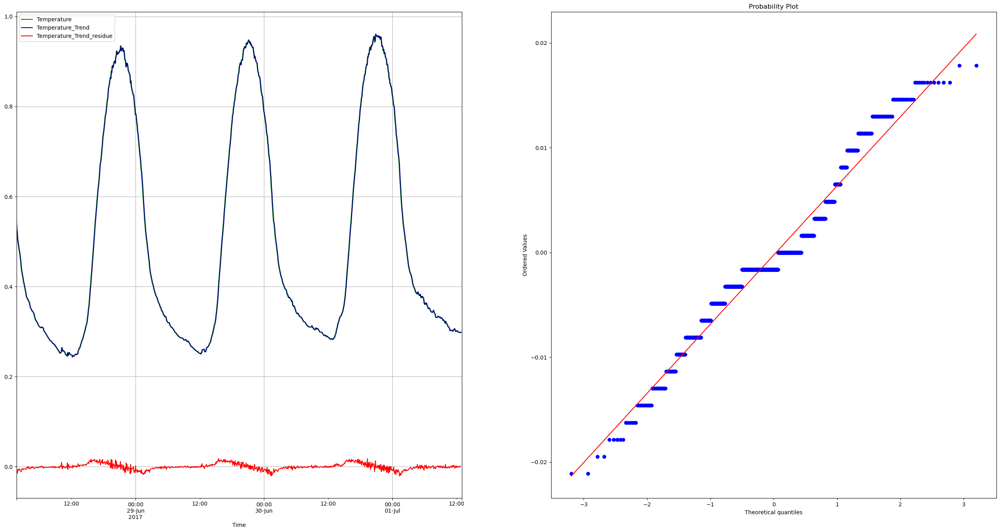

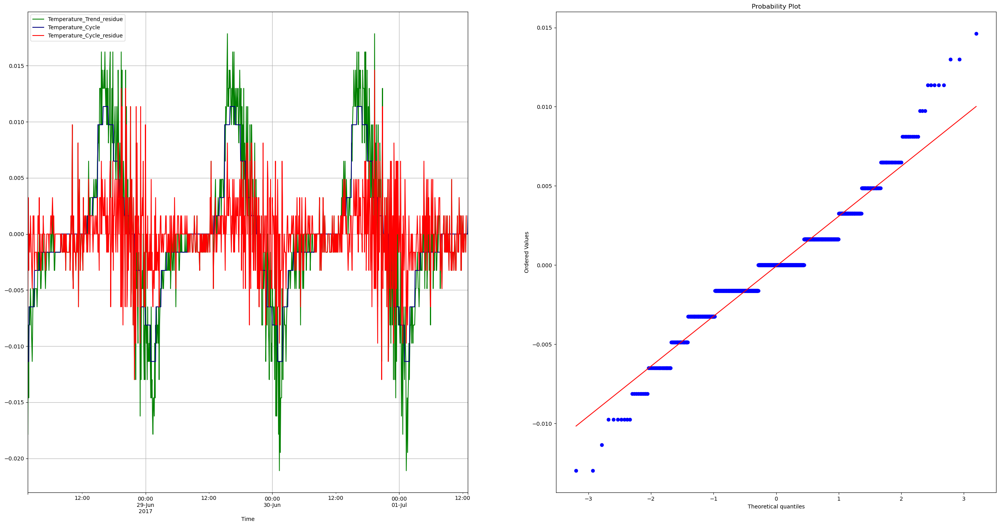

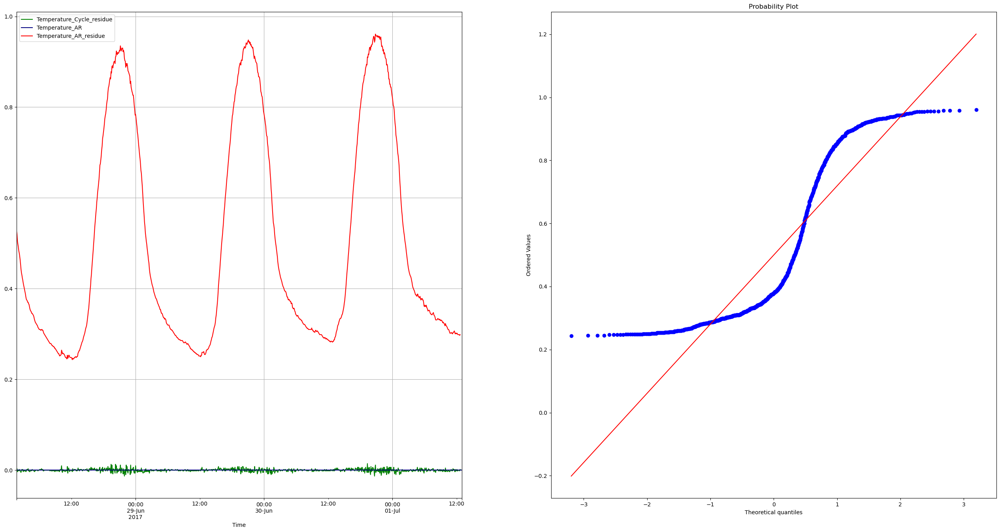

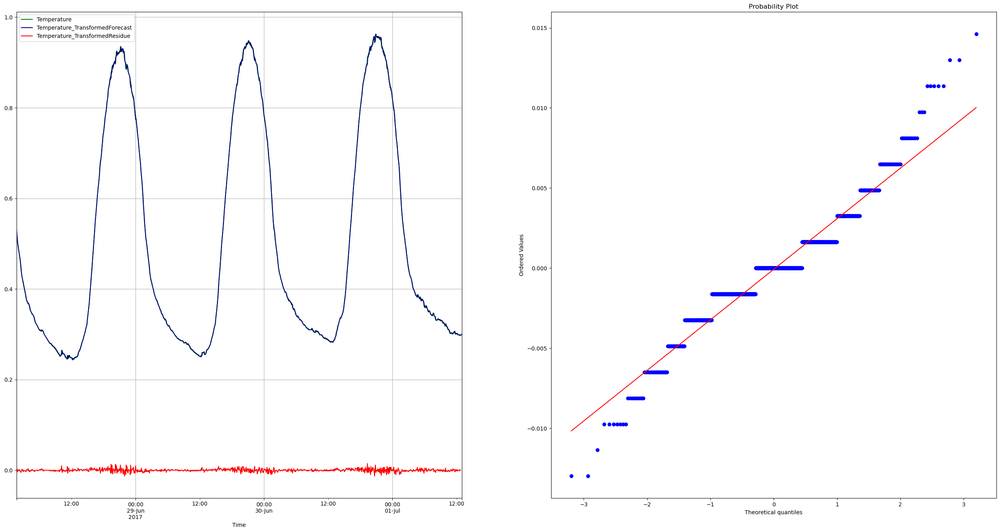

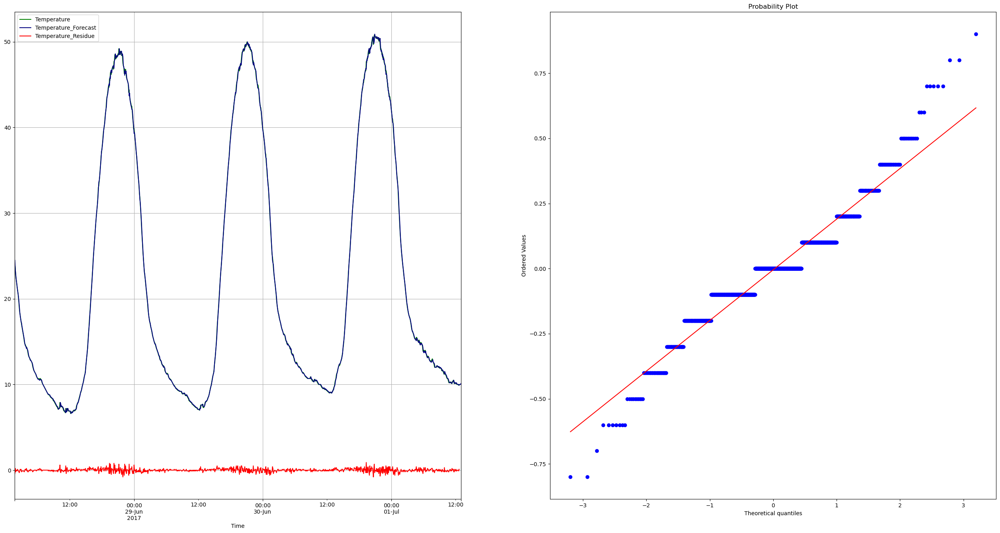

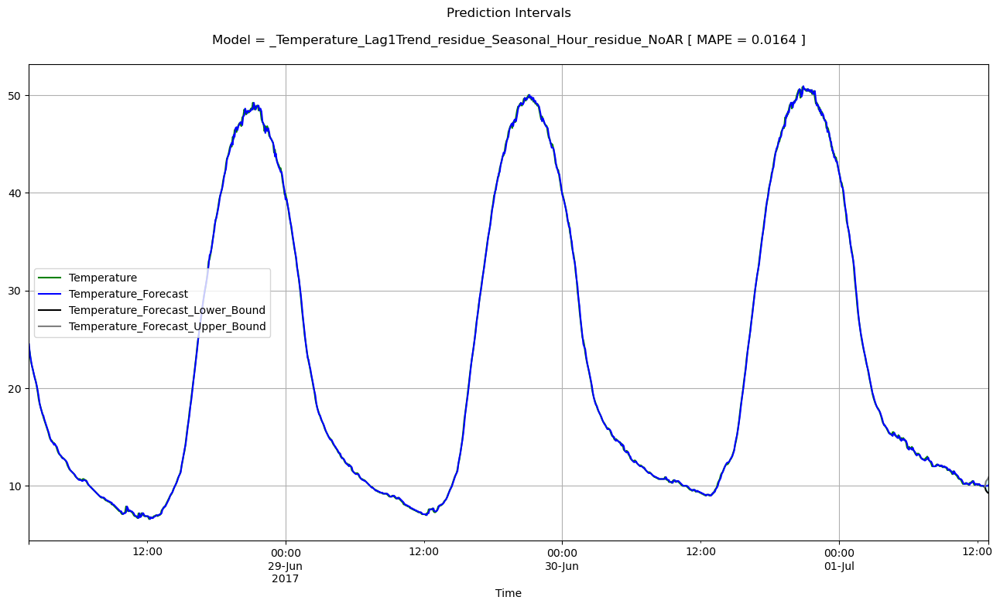

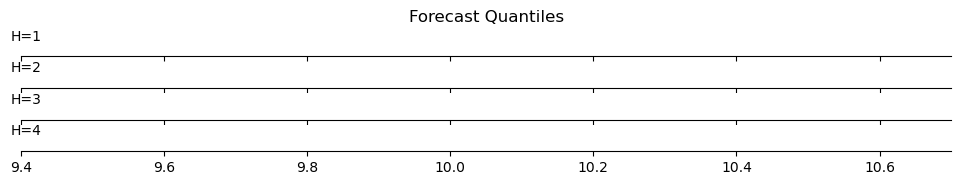

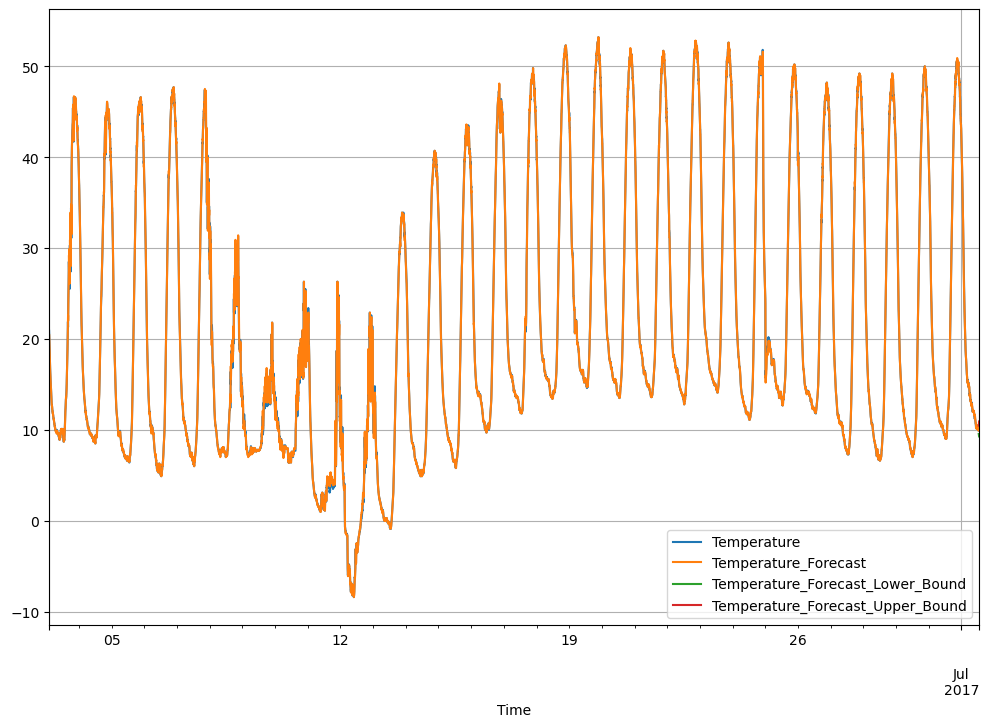

In [6]:
build_forecast_and_plot_model(4)

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 8}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pya

  Transformation DecompositionType  \
0   _Temperature             T+S+R   
1   _Temperature             T+S+R   
2   _Temperature             T+S+R   

                                               Model  Voting Complexity  
0  _Temperature_Lag1Trend_residue_Seasonal_Minute...   508.5      LSSSS  
1  _Temperature_Lag1Trend_residue_bestCycle_byMAP...   508.5      LSSSS  
2  _Temperature_Lag1Trend_residue_zeroCycle[0.0]_...   508.5      LSSSS  


INFO:pyaf.timing:('OPERATION_END_ELAPSED', 0.622, ('UPDATE_BEST_MODEL_PERFS', {'Signal': 'Temperature', 'Model': '_Temperature_Lag1Trend_residue_Seasonal_Minute_residue_AR(64)'}))
INFO:pyaf.timing:('OPERATION_START', ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 0.617, ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 1.327, ('FINALIZE_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', [('Temperature', 'None', 'CumSum_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', '_', 'T+S+R')])], 'Cores': 1}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 10.256, ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 8}}))
INFO:pyaf.std:TIME_DETAIL TimeVariable='Time' TimeMin=2017-06-03T02:05:00.000000 TimeMax=2017-06-25T19:35:00.000000 TimeDelta=<DateOffset: minutes=5> Horizo

  Transformation DecompositionType  \
0   _Temperature             T+S+R   
1   _Temperature             T+S+R   
2   _Temperature             T+S+R   

                                               Model  Voting Complexity  
0  _Temperature_Lag1Trend_residue_Seasonal_Minute...   508.5      LSSSS  
1  _Temperature_Lag1Trend_residue_bestCycle_byMAP...   508.5      LSSSS  
2  _Temperature_Lag1Trend_residue_zeroCycle[0.0]_...   508.5      LSSSS  


INFO:pyaf.timing:('OPERATION_END_ELAPSED', 1.315, ('PLOTTING', {'Signals': ['Temperature']}))
INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 8}))




<ModelInfo>
{
    "Temperature": {
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 8,
                "TimeMinMax": [
                    "2017-06-03 02:05:00",
                    "2017-07-01 12:40:00"
                ],
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "AR",
            "Best_Decomposition": "_Temperature_Lag1Trend_residue_Seasonal_Minute_residue_AR(64)",
            "Cycle": "Seasonal_Minute",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "Lag1Trend"
        },
        "Model_Performance": {
            "AUC": 0.4988,
            "COMPLEXITY": {
                "AR": "L",
                "Cycle": "S",
                "Decomposition": "S",
                "Transformation": "S",
                "Trend": "S"
            },
            "

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 0.24, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 8}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized', '_Temperature',
       '_Temperature_Lag1Trend', '_Temperature_Lag1Trend_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Minute',
       '_Temperature_Lag1Trend_residue_Seasonal_Minute_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Minute_residue_AR(64)',
       '_Temperature_Lag1Trend_residue_Seasonal_Minute_residue_AR(64)_residue',
       'Temperature_Transformed', '_Temperature_Trend',
       '_Temperature_Trend_residue', '_Temperature_Cycle',
       '_Temperature_Cycle_residue', '_Temperature_AR',
       '_Temperature_AR_residue', '_Temperature_TransformedForecast',
       'Temperature_Forecast', '_Temperature_TransformedResidue',
       'Temperature_Residue', 'Temperature_Forecast_Lower_Bound',
       'Temperature_Forecast_Upper_Bound', 'Temperature_Forecast_Quantile_5',
       'Temperature_Forecast_Quantile_10', 'Temperature_Forecast_Quantile_15',
       'Temperature_Forecast_Qua

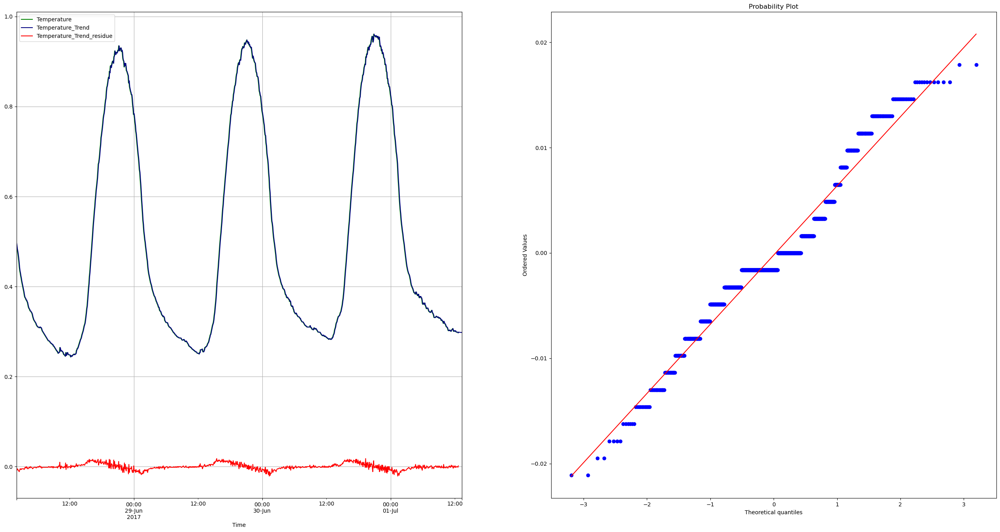

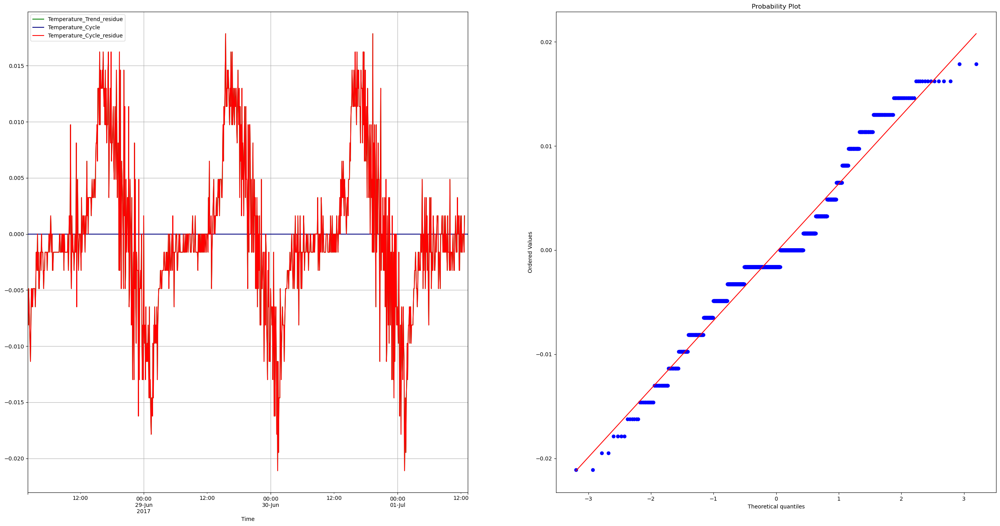

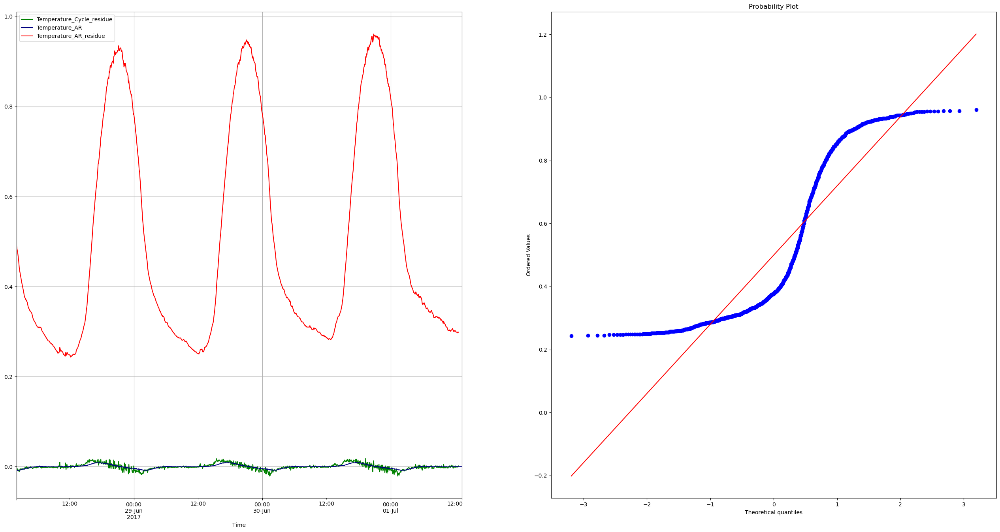

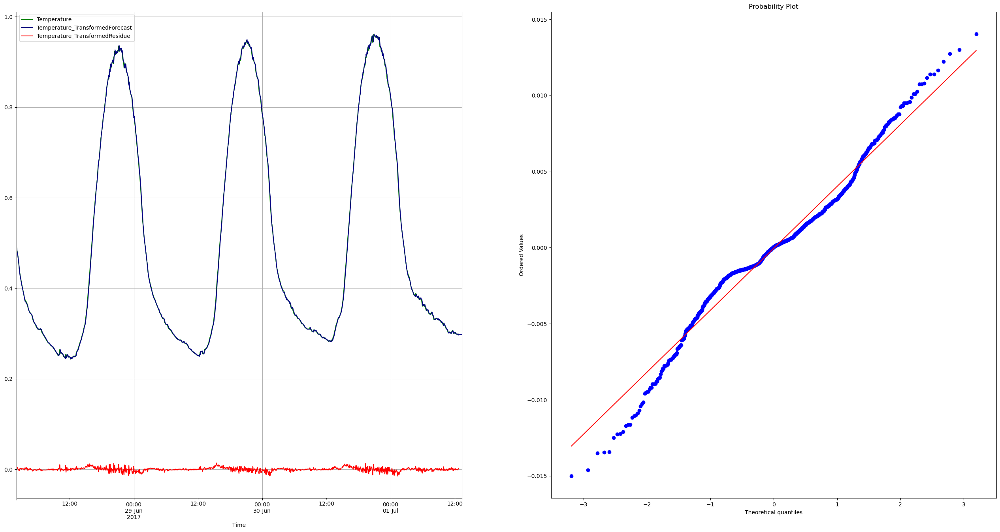

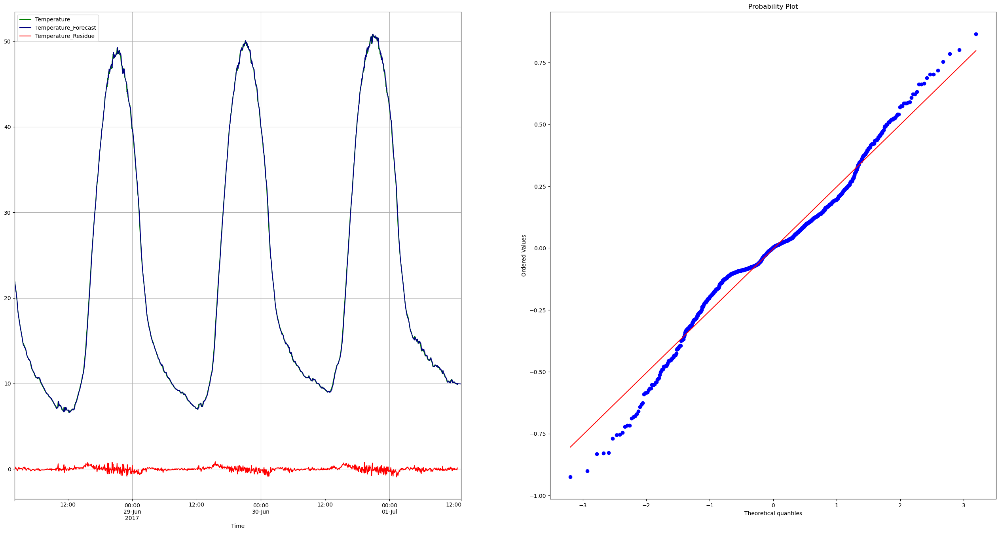

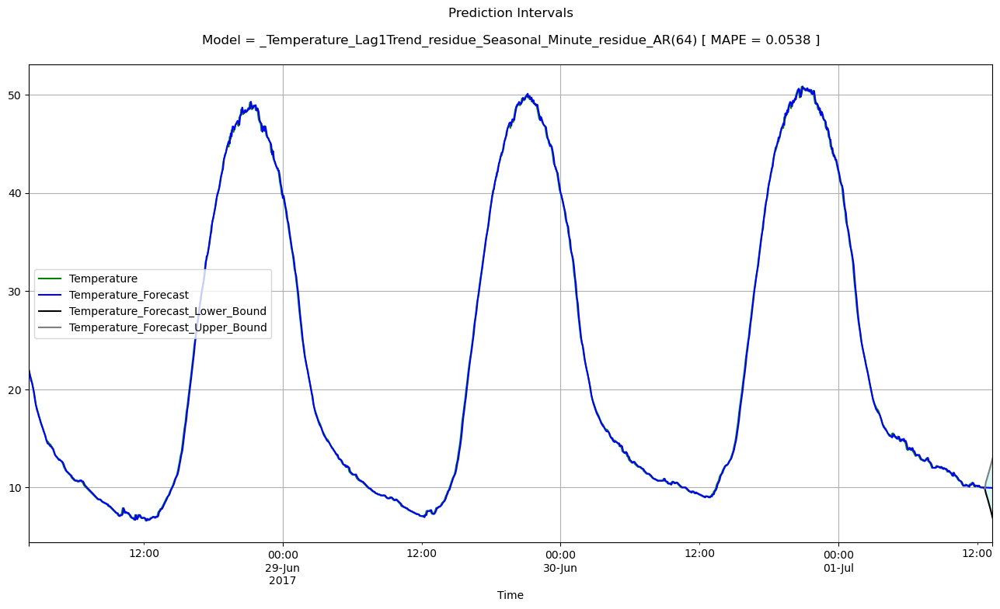

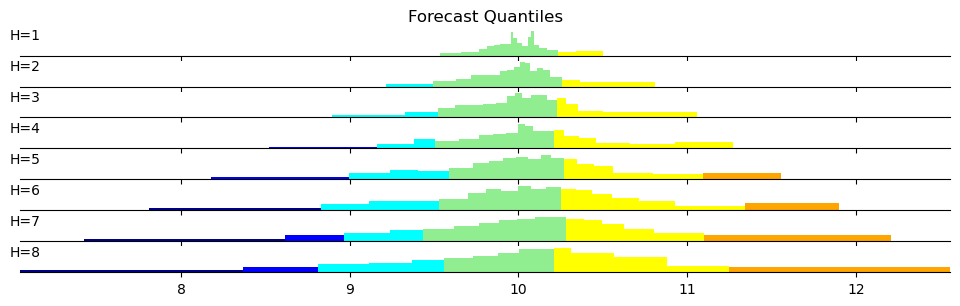

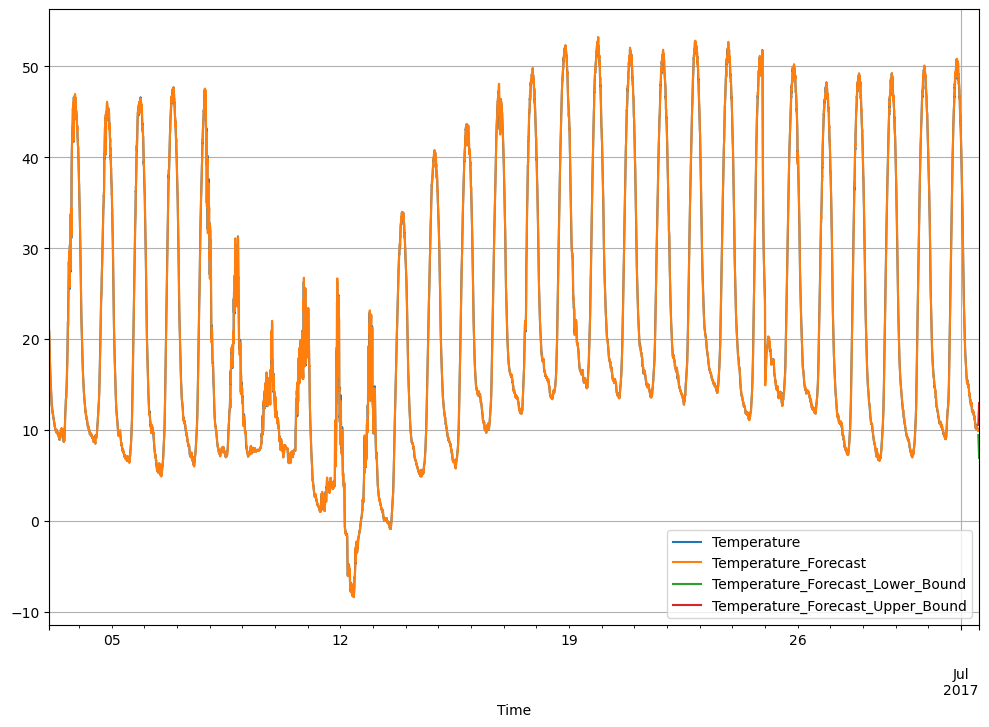

In [7]:
build_forecast_and_plot_model(8)

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 16}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:py

  Transformation DecompositionType  \
0   _Temperature             T+S+R   
1   _Temperature             T+S+R   
2   _Temperature             T+S+R   

                                               Model    Voting Complexity  
0  _Temperature_Lag1Trend_residue_Seasonal_Minute...  919.8125      LSSSS  
1  _Temperature_Lag1Trend_residue_bestCycle_byMAP...  919.8125      LSSSS  
2  _Temperature_Lag1Trend_residue_zeroCycle[0.0]_...  919.8125      LSSSS  


INFO:pyaf.timing:('OPERATION_END_ELAPSED', 1.255, ('UPDATE_BEST_MODEL_PERFS', {'Signal': 'Temperature', 'Model': '_Temperature_Lag1Trend_residue_Seasonal_Minute_residue_AR(64)'}))
INFO:pyaf.timing:('OPERATION_START', ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 1.258, ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 2.645, ('FINALIZE_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', [('Temperature', 'None', 'CumSum_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', '_', 'T+S+R')])], 'Cores': 1}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 16.911, ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 16}}))
INFO:pyaf.std:TIME_DETAIL TimeVariable='Time' TimeMin=2017-06-03T02:05:00.000000 TimeMax=2017-06-25T19:00:00.000000 TimeDelta=<DateOffset: minutes=5> Horiz

  Transformation DecompositionType  \
0   _Temperature             T+S+R   
1   _Temperature             T+S+R   
2   _Temperature             T+S+R   

                                               Model    Voting Complexity  
0  _Temperature_Lag1Trend_residue_Seasonal_Minute...  919.8125      LSSSS  
1  _Temperature_Lag1Trend_residue_bestCycle_byMAP...  919.8125      LSSSS  
2  _Temperature_Lag1Trend_residue_zeroCycle[0.0]_...  919.8125      LSSSS  


INFO:pyaf.timing:('OPERATION_END_ELAPSED', 2.443, ('PLOTTING', {'Signals': ['Temperature']}))
INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 16}))




<ModelInfo>
{
    "Temperature": {
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 16,
                "TimeMinMax": [
                    "2017-06-03 02:05:00",
                    "2017-07-01 12:40:00"
                ],
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "AR",
            "Best_Decomposition": "_Temperature_Lag1Trend_residue_Seasonal_Minute_residue_AR(64)",
            "Cycle": "Seasonal_Minute",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "Lag1Trend"
        },
        "Model_Performance": {
            "AUC": 0.5048,
            "COMPLEXITY": {
                "AR": "L",
                "Cycle": "S",
                "Decomposition": "S",
                "Transformation": "S",
                "Trend": "S"
            },
            

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 0.482, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 16}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized', '_Temperature',
       '_Temperature_Lag1Trend', '_Temperature_Lag1Trend_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Minute',
       '_Temperature_Lag1Trend_residue_Seasonal_Minute_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Minute_residue_AR(64)',
       '_Temperature_Lag1Trend_residue_Seasonal_Minute_residue_AR(64)_residue',
       'Temperature_Transformed', '_Temperature_Trend',
       '_Temperature_Trend_residue', '_Temperature_Cycle',
       '_Temperature_Cycle_residue', '_Temperature_AR',
       '_Temperature_AR_residue', '_Temperature_TransformedForecast',
       'Temperature_Forecast', '_Temperature_TransformedResidue',
       'Temperature_Residue', 'Temperature_Forecast_Lower_Bound',
       'Temperature_Forecast_Upper_Bound', 'Temperature_Forecast_Quantile_5',
       'Temperature_Forecast_Quantile_10', 'Temperature_Forecast_Quantile_15',
       'Temperature_Forecast_Qua

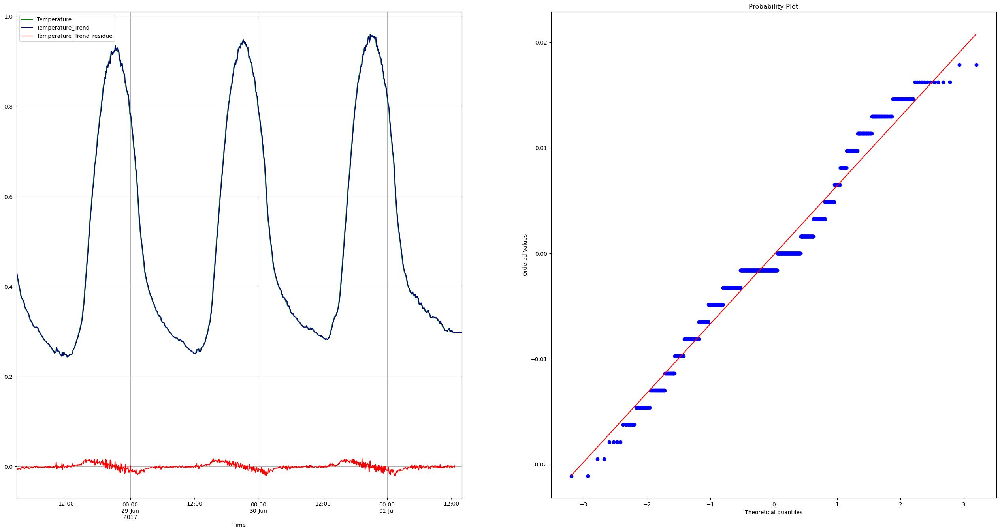

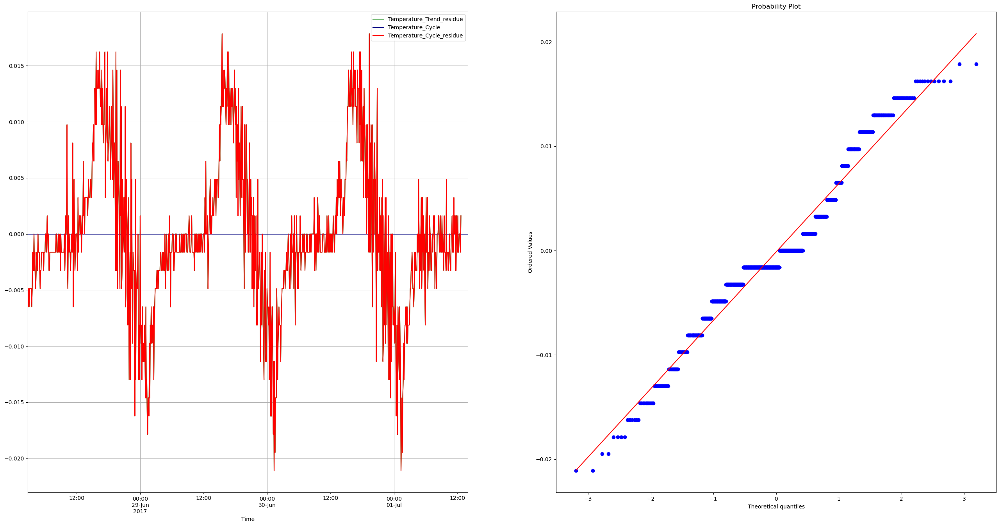

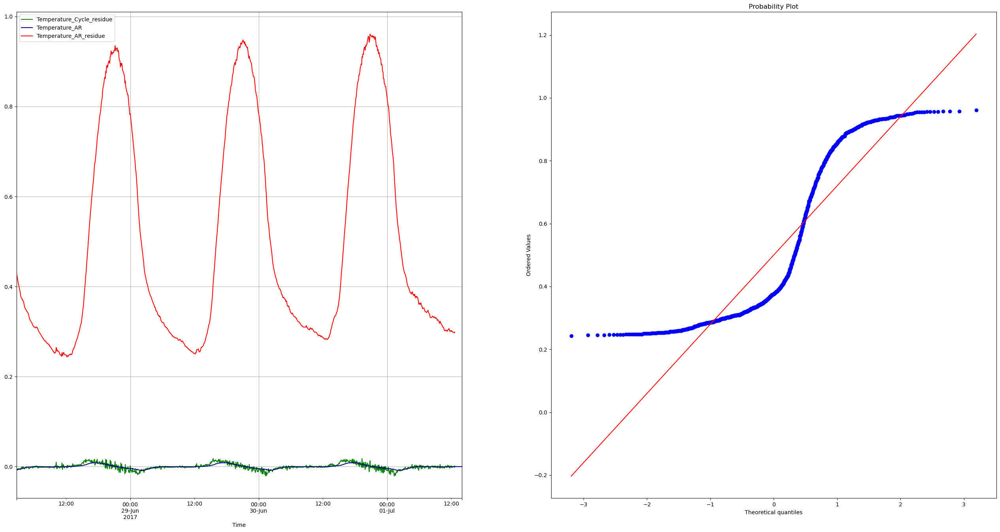

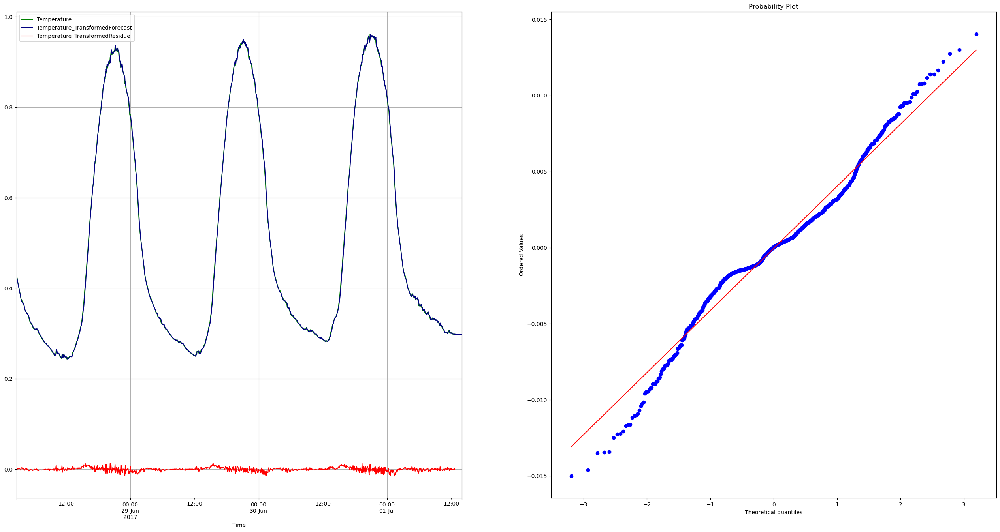

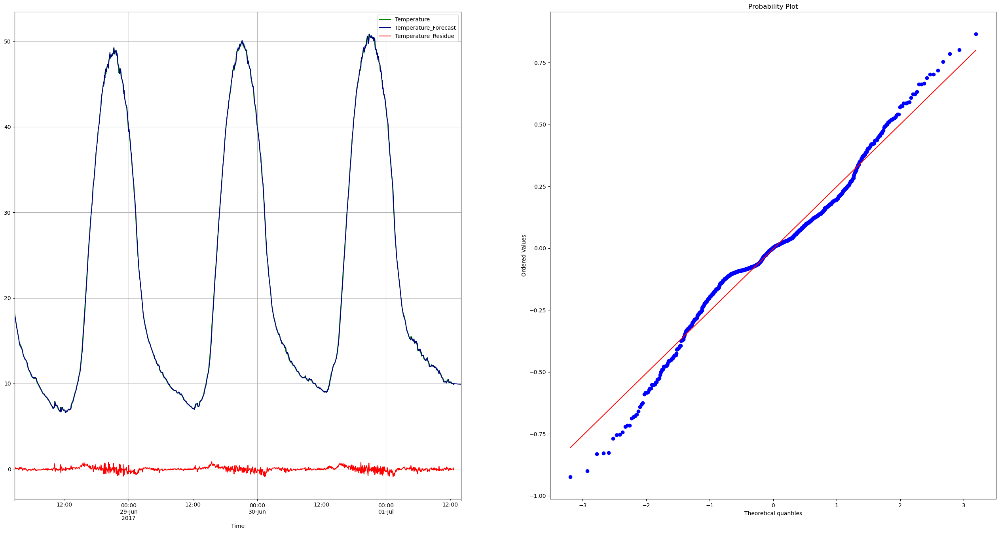

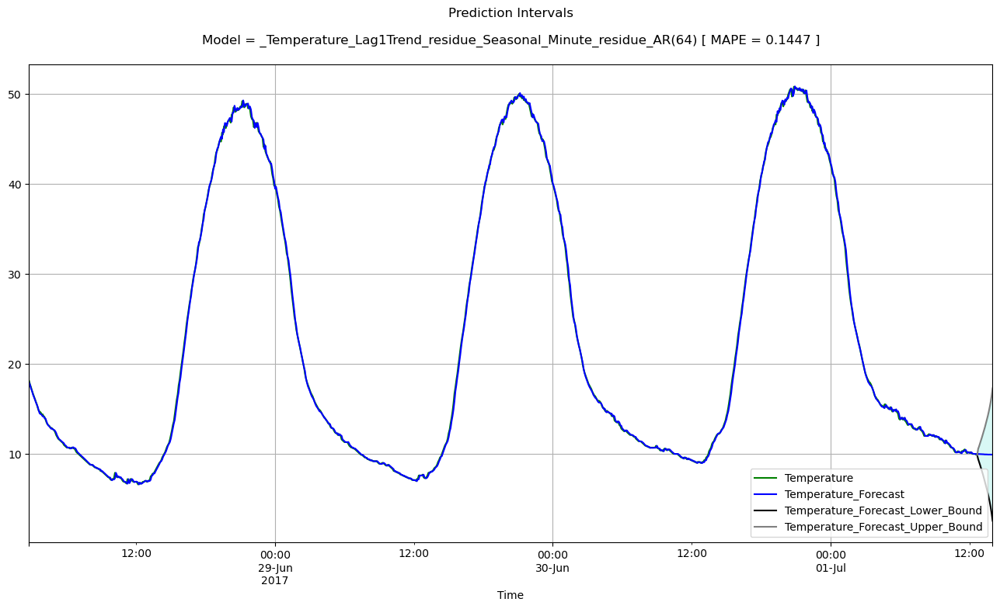

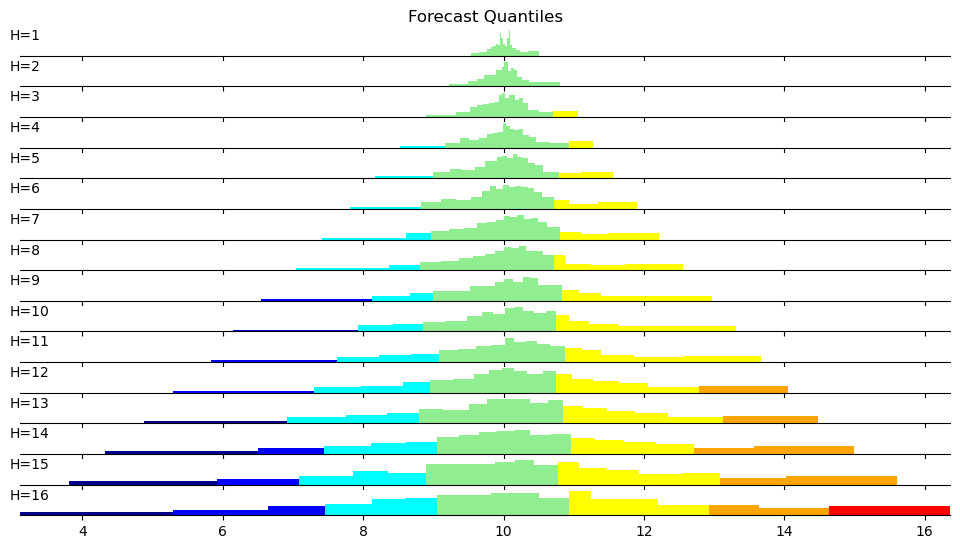

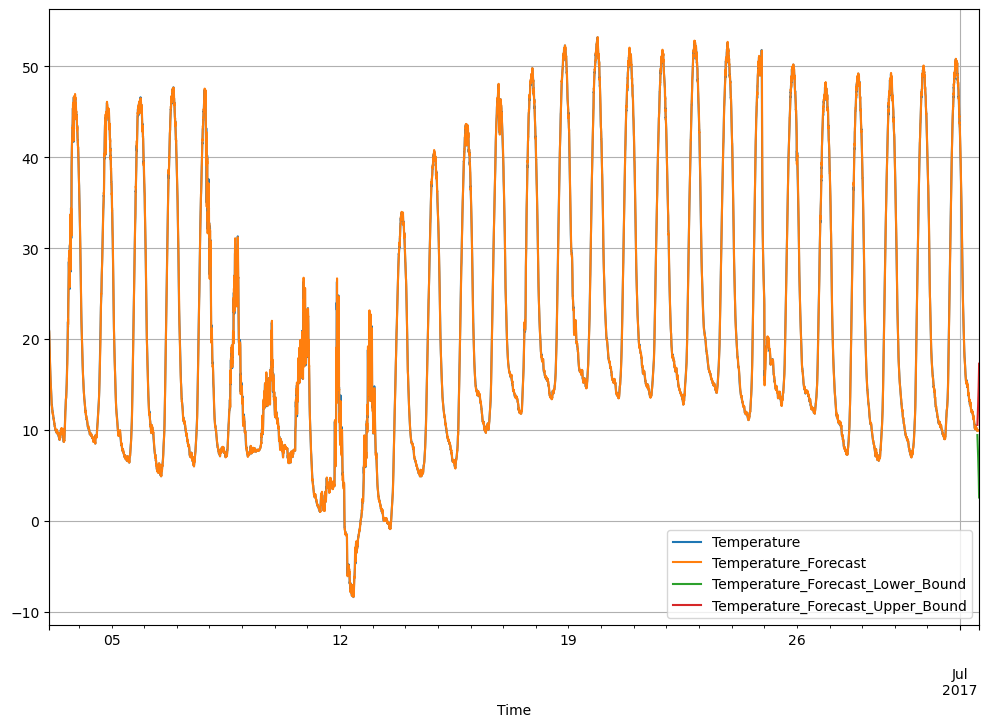

In [8]:
build_forecast_and_plot_model(16)

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 32}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:py

       Transformation DecompositionType  \
0  CumSum_Temperature             T+S+R   

                                               Model     Voting Complexity  
0  CumSum_Temperature_Lag1Trend_residue_Seasonal_...  1852.6875      MSSSS  


INFO:pyaf.timing:('OPERATION_END_ELAPSED', 2.089, ('UPDATE_BEST_MODEL_PERFS', {'Signal': 'Temperature', 'Model': 'CumSum_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR'}))
INFO:pyaf.timing:('OPERATION_START', ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 2.085, ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 4.418, ('FINALIZE_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', [('Temperature', 'None', 'CumSum_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', '_', 'T+S+R')])], 'Cores': 1}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 30.452, ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 32}}))
INFO:pyaf.std:TIME_DETAIL TimeVariable='Time' TimeMin=2017-06-03T02:05:00.000000 TimeMax=2017-06-25T18:00:00.000000 TimeDelta=<DateOffset: minutes=5> Hor

       Transformation DecompositionType  \
0  CumSum_Temperature             T+S+R   

                                               Model     Voting Complexity  
0  CumSum_Temperature_Lag1Trend_residue_Seasonal_...  1852.6875      MSSSS  


INFO:pyaf.timing:('OPERATION_END_ELAPSED', 3.147, ('PLOTTING', {'Signals': ['Temperature']}))
INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 32}))




<ModelInfo>
{
    "Temperature": {
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 32,
                "TimeMinMax": [
                    "2017-06-03 02:05:00",
                    "2017-07-01 12:40:00"
                ],
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "NoAR",
            "Best_Decomposition": "CumSum_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR",
            "Cycle": "Seasonal_Hour",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "Integration",
            "Trend": "Lag1Trend"
        },
        "Model_Performance": {
            "AUC": 0.4928,
            "COMPLEXITY": {
                "AR": "S",
                "Cycle": "S",
                "Decomposition": "S",
                "Transformation": "M",
                "Trend": "S"
            },
       

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 0.639, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 32}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized',
       'CumSum_Temperature', 'CumSum_Temperature_Lag1Trend',
       'CumSum_Temperature_Lag1Trend_residue',
       'CumSum_Temperature_Lag1Trend_residue_Seasonal_Hour',
       'CumSum_Temperature_Lag1Trend_residue_Seasonal_Hour_residue',
       'CumSum_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR',
       'CumSum_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR_residue',
       'Temperature_Transformed', 'CumSum_Temperature_Trend',
       'CumSum_Temperature_Trend_residue', 'CumSum_Temperature_Cycle',
       'CumSum_Temperature_Cycle_residue', 'CumSum_Temperature_AR',
       'CumSum_Temperature_AR_residue',
       'CumSum_Temperature_TransformedForecast', 'Temperature_Forecast',
       'CumSum_Temperature_TransformedResidue', 'Temperature_Residue',
       'Temperature_Forecast_Lower_Bound', 'Temperature_Forecast_Upper_Bound',
       'Temperature_Forecast_Quantile_5', 'Temperature_Foreca

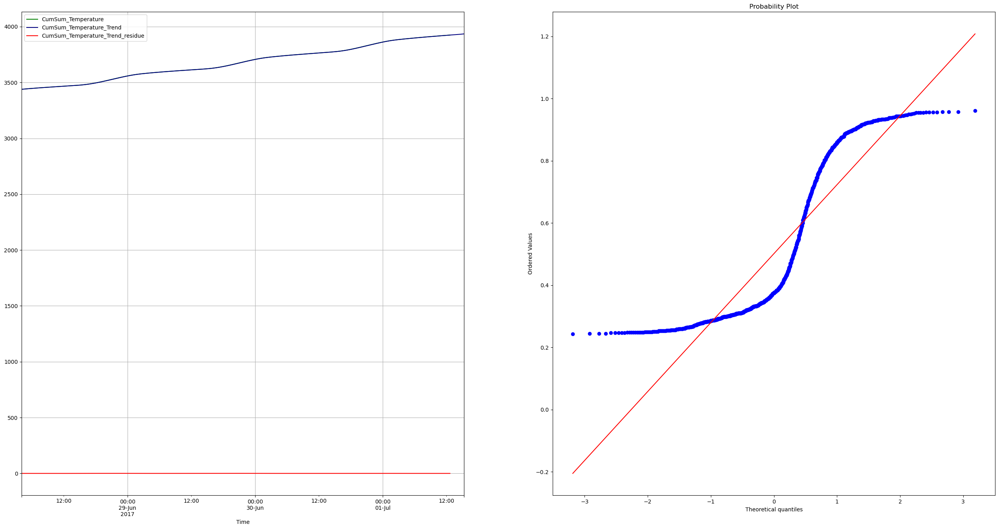

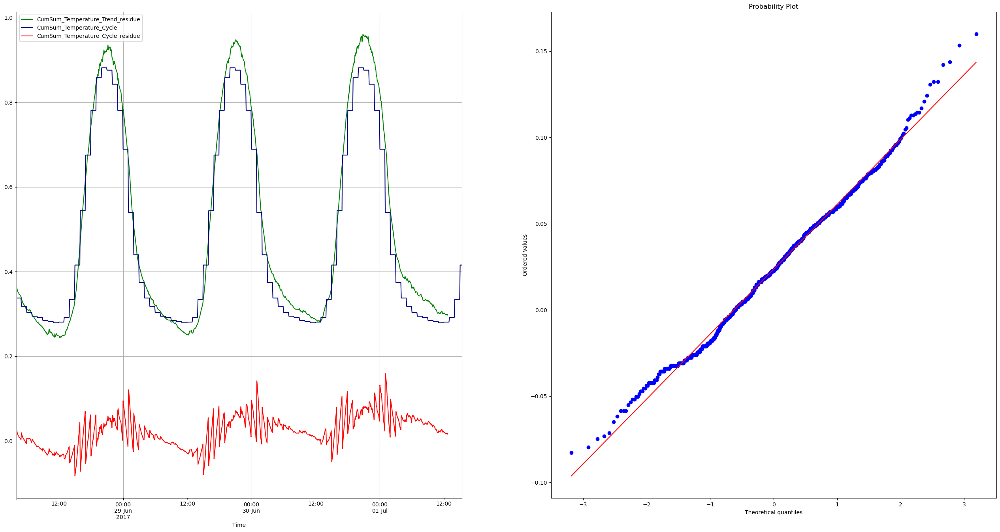

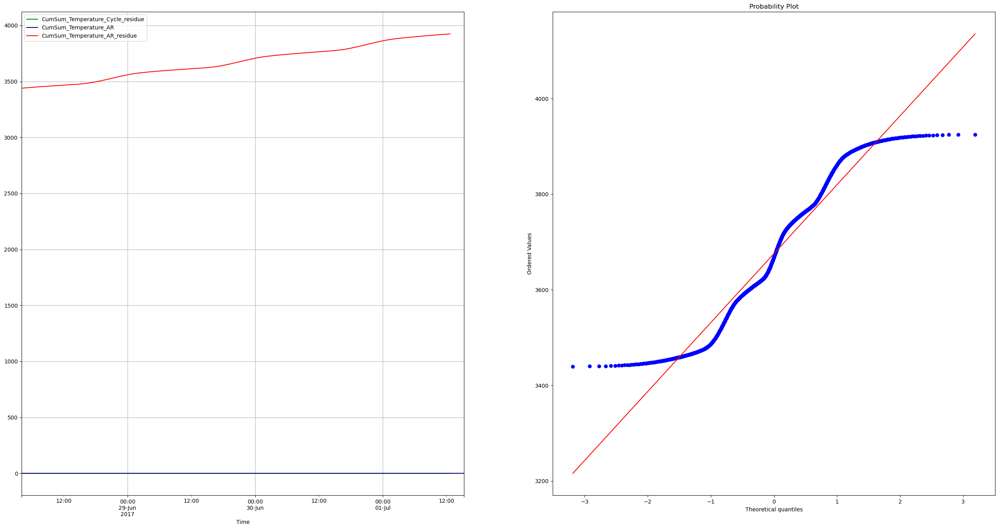

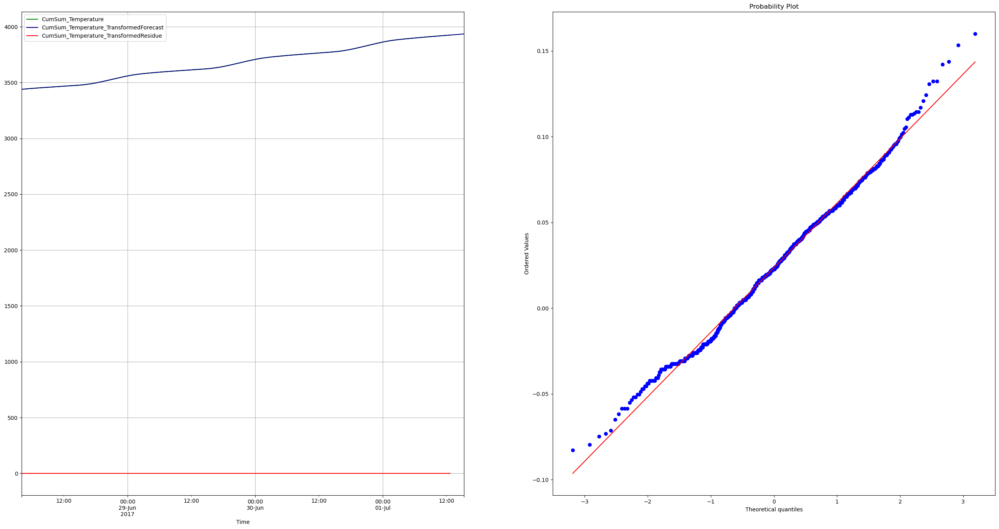

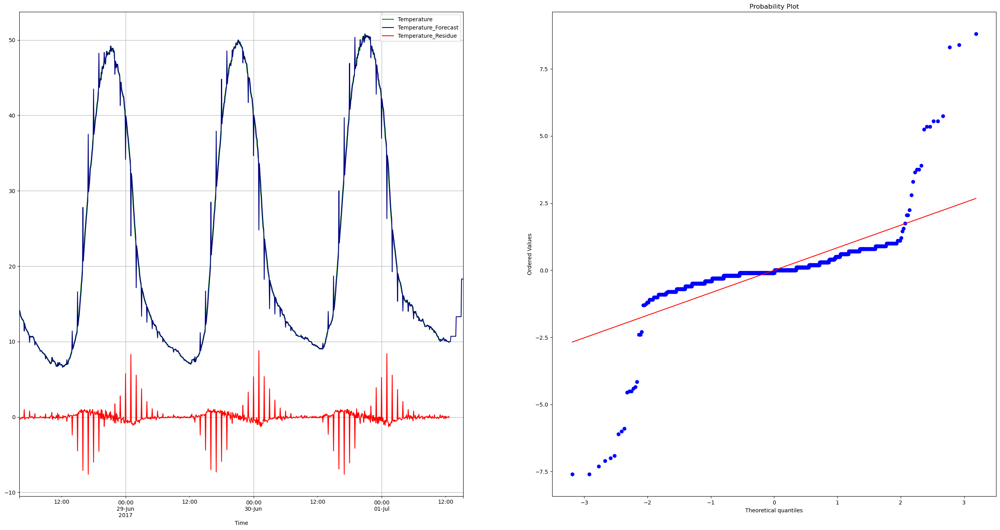

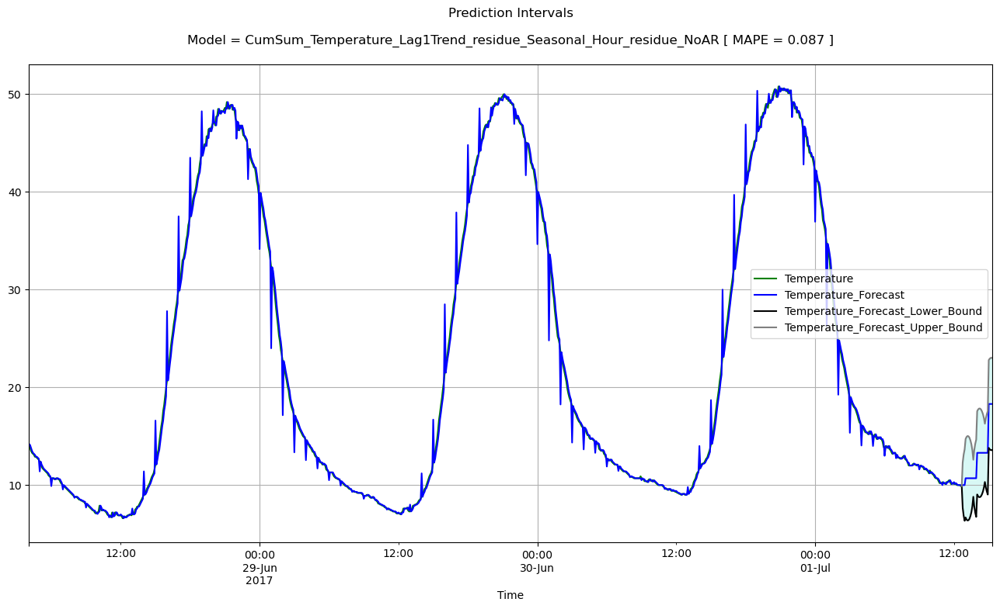

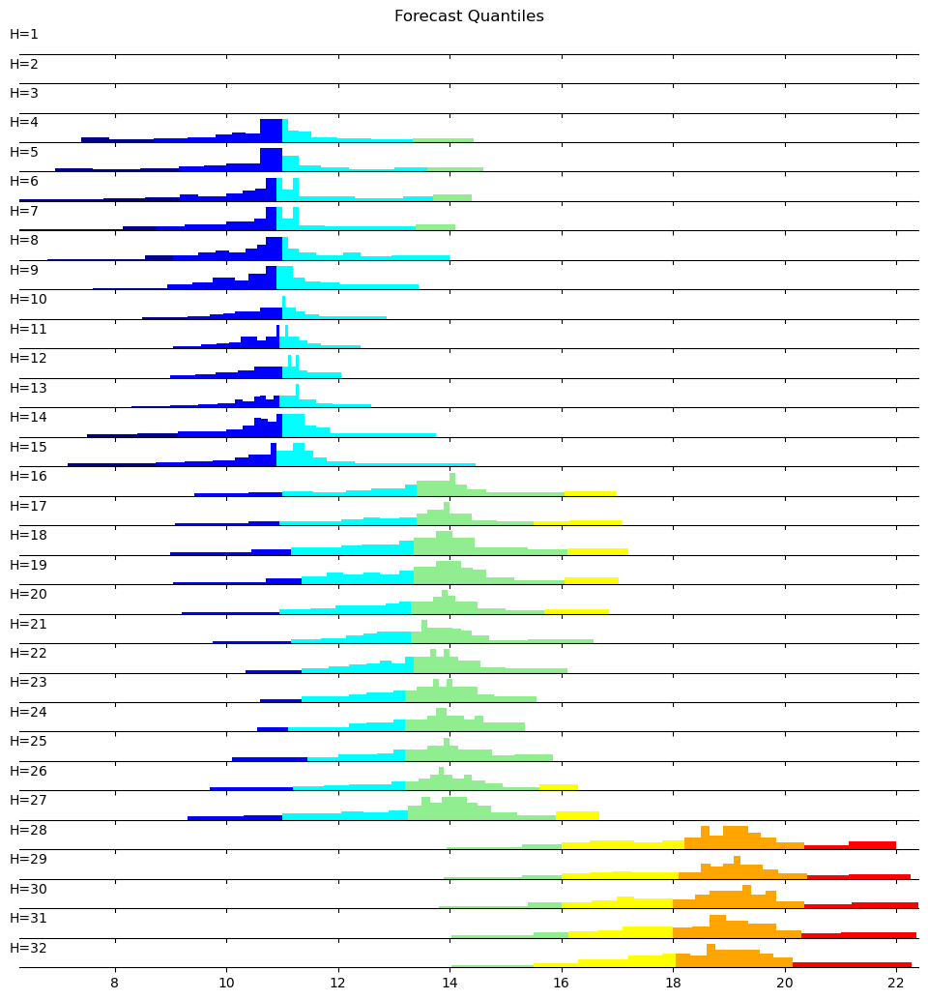

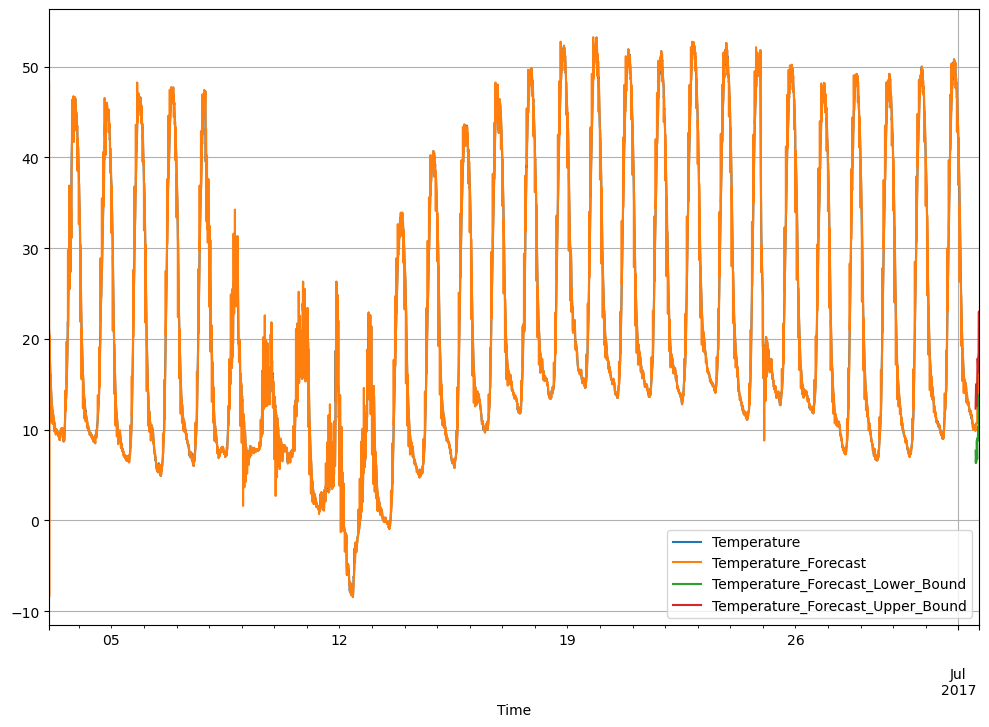

In [9]:
build_forecast_and_plot_model(32)

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 64}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:py

       Transformation DecompositionType  \
1        _Temperature             T+S+R   
0  CumSum_Temperature             T+S+R   

                                               Model     Voting Complexity  
1  _Temperature_ConstantTrend_residue_Seasonal_Ho...  3570.6094      SSSSS  
0  CumSum_Temperature_Lag1Trend_residue_Seasonal_...  3601.5000      MSSSS  


INFO:pyaf.timing:('OPERATION_END_ELAPSED', 3.717, ('UPDATE_BEST_MODEL_PERFS', {'Signal': 'Temperature', 'Model': '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR'}))
INFO:pyaf.timing:('OPERATION_START', ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 3.502, ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 7.646, ('FINALIZE_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', [('Temperature', 'None', 'CumSum_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', '_', 'T+S+R')])], 'Cores': 1}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 58.883, ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 64}}))
INFO:pyaf.std:TIME_DETAIL TimeVariable='Time' TimeMin=2017-06-03T02:05:00.000000 TimeMax=2017-06-25T15:50:00.000000 TimeDelta=<DateOffset: minutes=5> Horiz

       Transformation DecompositionType  \
1        _Temperature             T+S+R   
0  CumSum_Temperature             T+S+R   

                                               Model     Voting Complexity  
1  _Temperature_ConstantTrend_residue_Seasonal_Ho...  3570.6094      SSSSS  
0  CumSum_Temperature_Lag1Trend_residue_Seasonal_...  3601.5000      MSSSS  


INFO:pyaf.timing:('OPERATION_END_ELAPSED', 5.805, ('PLOTTING', {'Signals': ['Temperature']}))
INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 64}))




<ModelInfo>
{
    "Temperature": {
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 64,
                "TimeMinMax": [
                    "2017-06-03 02:05:00",
                    "2017-07-01 12:40:00"
                ],
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "NoAR",
            "Best_Decomposition": "_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR",
            "Cycle": "Seasonal_Hour",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "ConstantTrend"
        },
        "Model_Performance": {
            "AUC": 0.5444,
            "COMPLEXITY": {
                "AR": "S",
                "Cycle": "S",
                "Decomposition": "S",
                "Transformation": "S",
                "Trend": "S"
            },
        

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 1.224, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 64}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized', '_Temperature',
       '_Temperature_ConstantTrend', '_Temperature_ConstantTrend_residue',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR_residue',
       'Temperature_Transformed', '_Temperature_Trend',
       '_Temperature_Trend_residue', '_Temperature_Cycle',
       '_Temperature_Cycle_residue', '_Temperature_AR',
       '_Temperature_AR_residue', '_Temperature_TransformedForecast',
       'Temperature_Forecast', '_Temperature_TransformedResidue',
       'Temperature_Residue', 'Temperature_Forecast_Lower_Bound',
       'Temperature_Forecast_Upper_Bound', 'Temperature_Forecast_Quantile_5',
       'Temperature_Forecast_Quantile_10', 'Temperature_Forecast_Quantile_15',
       'Temperature_

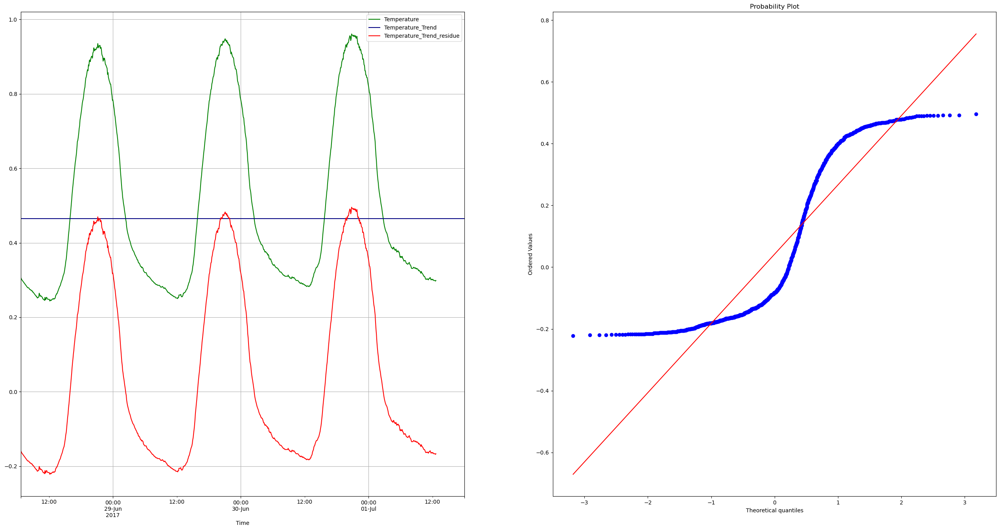

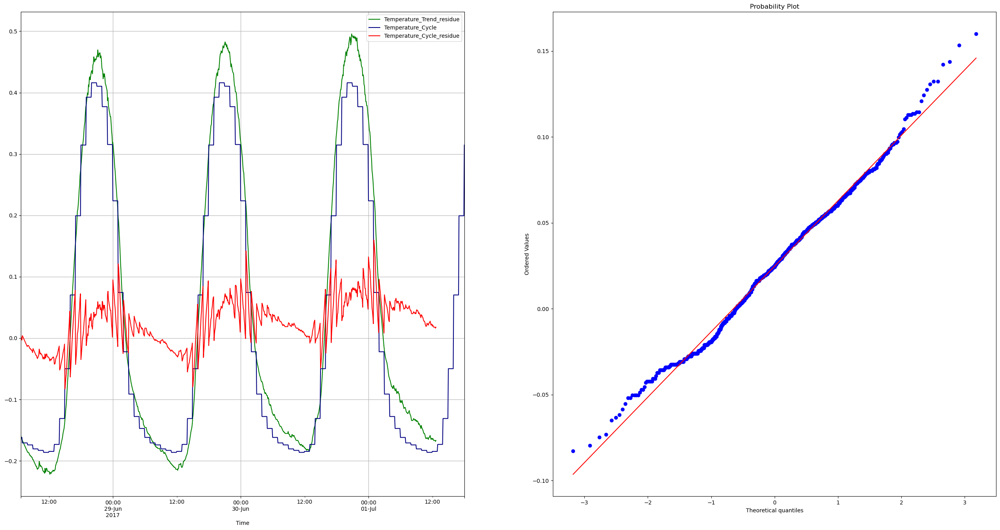

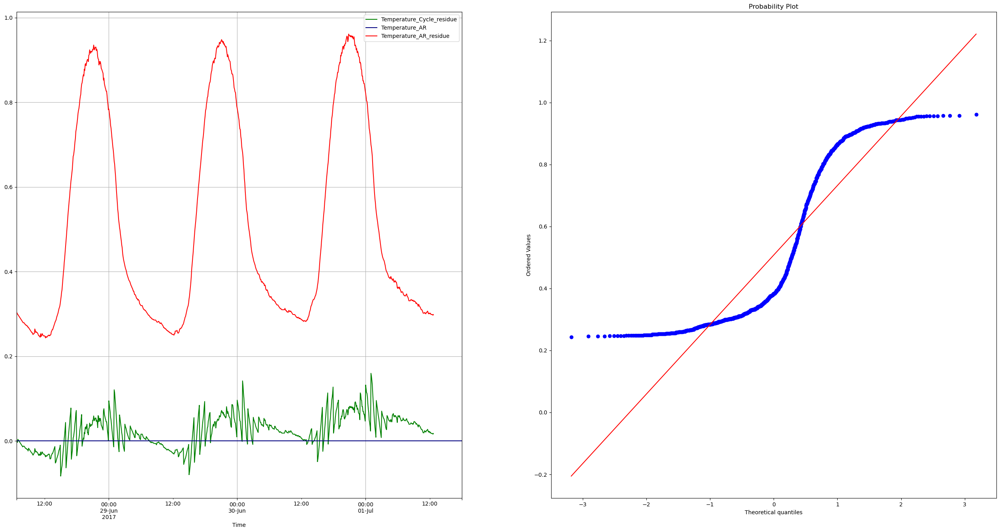

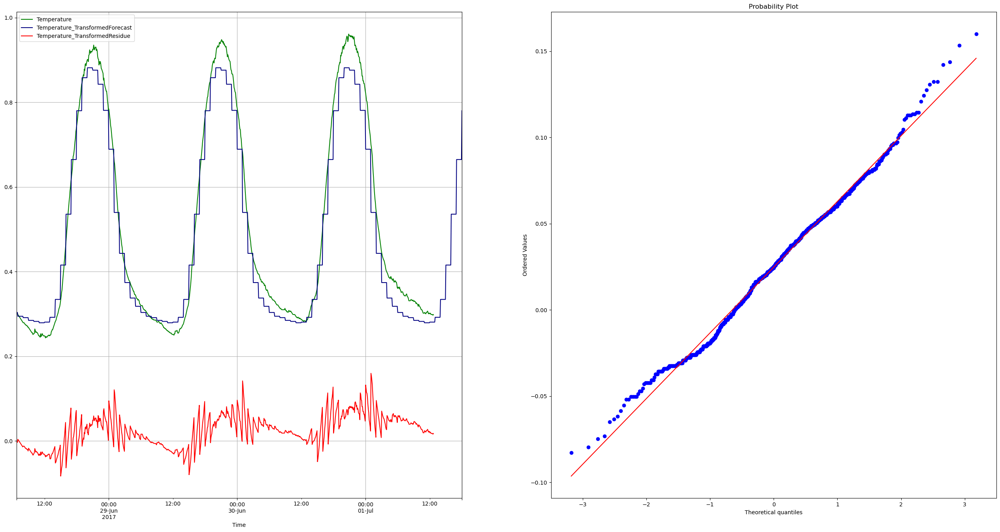

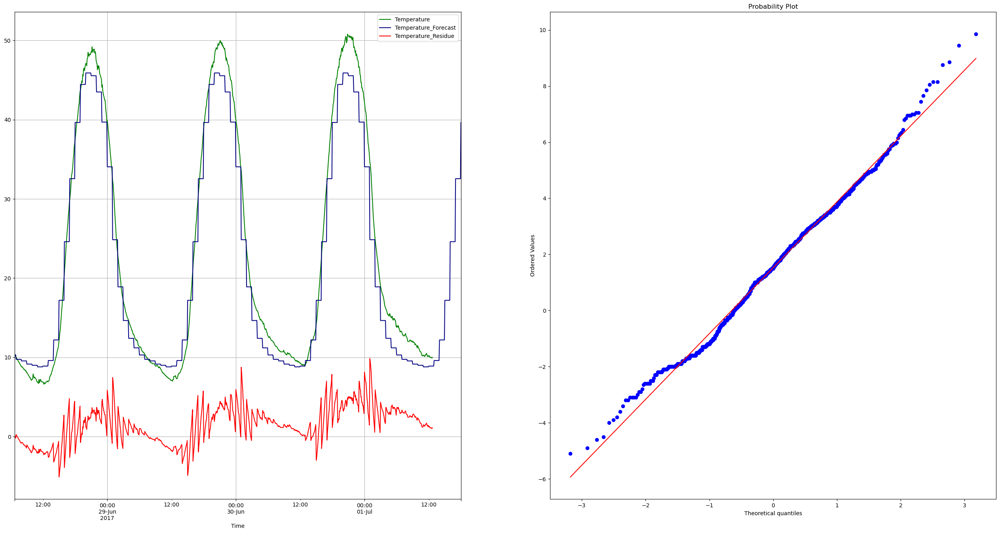

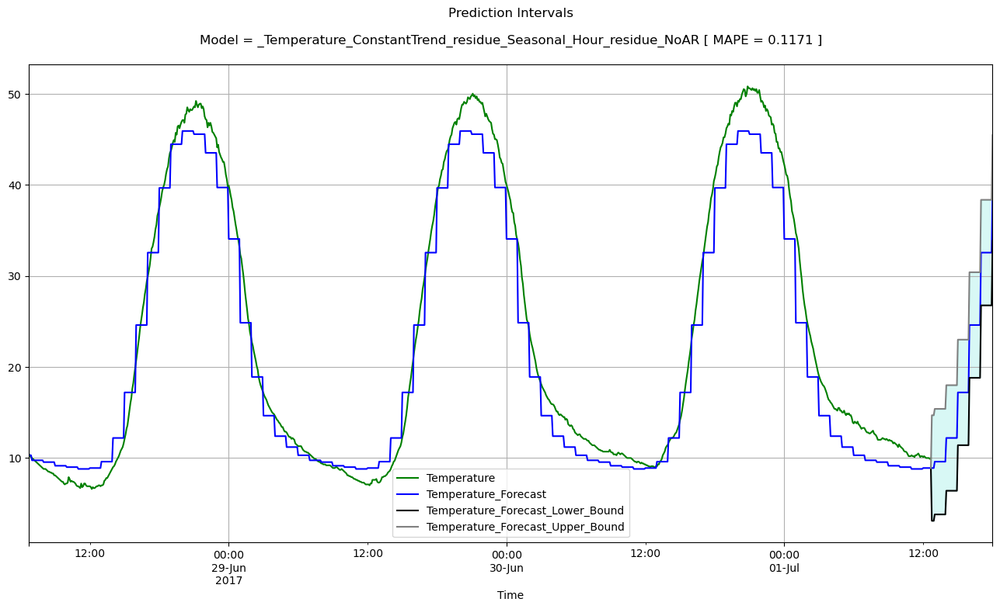

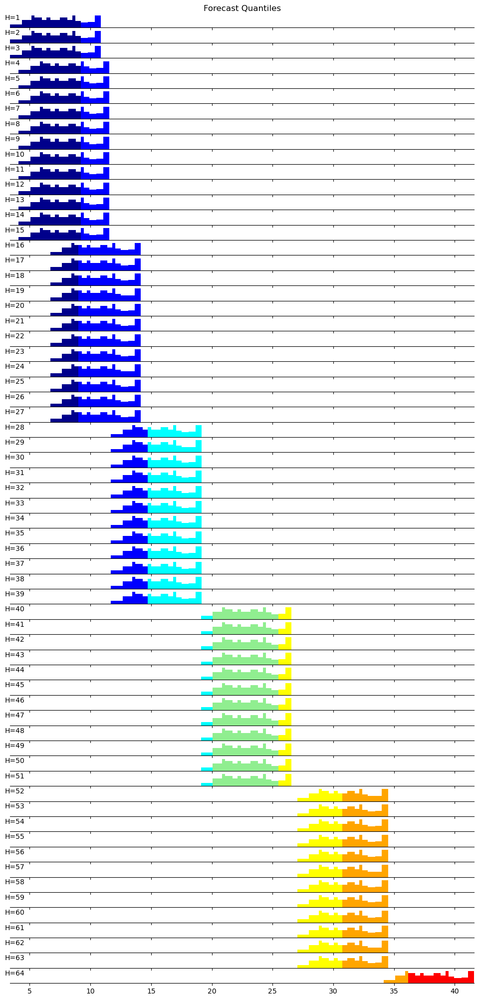

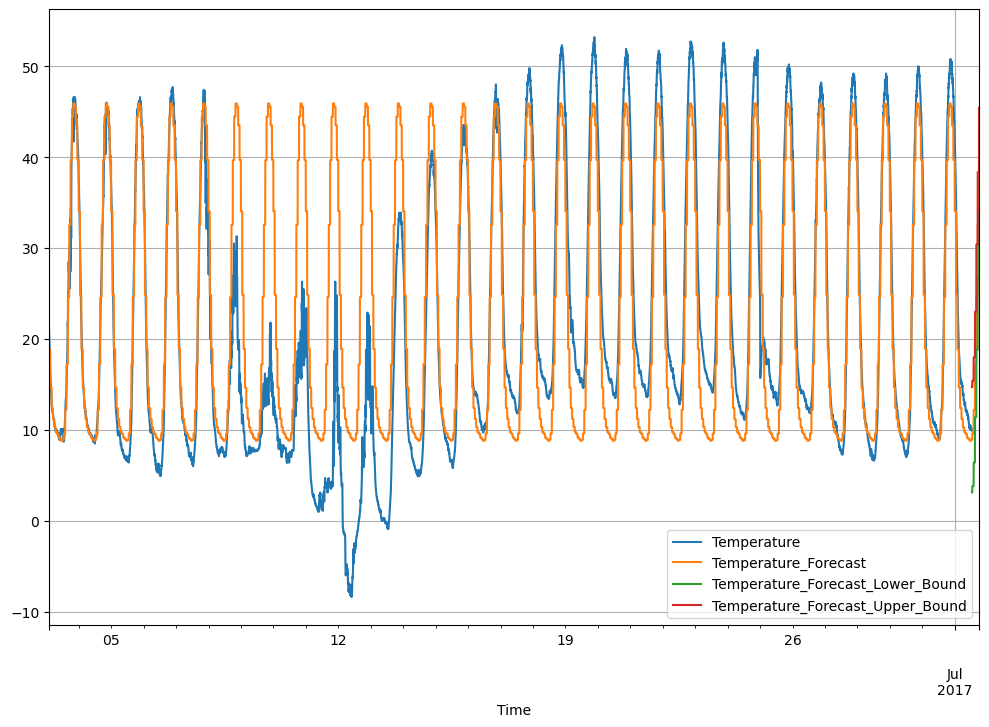

In [10]:
build_forecast_and_plot_model(64)

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 128}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:p

       Transformation DecompositionType  \
0        _Temperature             T+S+R   
1  CumSum_Temperature             T+S+R   

                                               Model     Voting Complexity  
0  _Temperature_ConstantTrend_residue_Seasonal_Ho...  7523.5547      SSSSS  
1  CumSum_Temperature_Lag1Trend_residue_Seasonal_...  7494.1484      MSSSS  


INFO:pyaf.timing:('OPERATION_END_ELAPSED', 7.302, ('UPDATE_BEST_MODEL_PERFS', {'Signal': 'Temperature', 'Model': '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR'}))
INFO:pyaf.timing:('OPERATION_START', ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 7.428, ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 15.622, ('FINALIZE_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', [('Temperature', 'None', 'CumSum_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', '_', 'T+S+R')])], 'Cores': 1}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 117.204, ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 128}}))
INFO:pyaf.std:TIME_DETAIL TimeVariable='Time' TimeMin=2017-06-03T02:05:00.000000 TimeMax=2017-06-25T11:35:00.000000 TimeDelta=<DateOffset: minutes=5> Ho

       Transformation DecompositionType  \
0        _Temperature             T+S+R   
1  CumSum_Temperature             T+S+R   

                                               Model     Voting Complexity  
0  _Temperature_ConstantTrend_residue_Seasonal_Ho...  7523.5547      SSSSS  
1  CumSum_Temperature_Lag1Trend_residue_Seasonal_...  7494.1484      MSSSS  


INFO:pyaf.timing:('OPERATION_END_ELAPSED', 10.945, ('PLOTTING', {'Signals': ['Temperature']}))
INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 128}))




<ModelInfo>
{
    "Temperature": {
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 128,
                "TimeMinMax": [
                    "2017-06-03 02:05:00",
                    "2017-07-01 12:40:00"
                ],
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "NoAR",
            "Best_Decomposition": "_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR",
            "Cycle": "Seasonal_Hour",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "ConstantTrend"
        },
        "Model_Performance": {
            "AUC": 0.5489,
            "COMPLEXITY": {
                "AR": "S",
                "Cycle": "S",
                "Decomposition": "S",
                "Transformation": "S",
                "Trend": "S"
            },
       

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 2.442, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 128}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized', '_Temperature',
       '_Temperature_ConstantTrend', '_Temperature_ConstantTrend_residue',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR_residue',
       'Temperature_Transformed', '_Temperature_Trend',
       '_Temperature_Trend_residue', '_Temperature_Cycle',
       '_Temperature_Cycle_residue', '_Temperature_AR',
       '_Temperature_AR_residue', '_Temperature_TransformedForecast',
       'Temperature_Forecast', '_Temperature_TransformedResidue',
       'Temperature_Residue', 'Temperature_Forecast_Lower_Bound',
       'Temperature_Forecast_Upper_Bound', 'Temperature_Forecast_Quantile_5',
       'Temperature_Forecast_Quantile_10', 'Temperature_Forecast_Quantile_15',
       'Temperature_

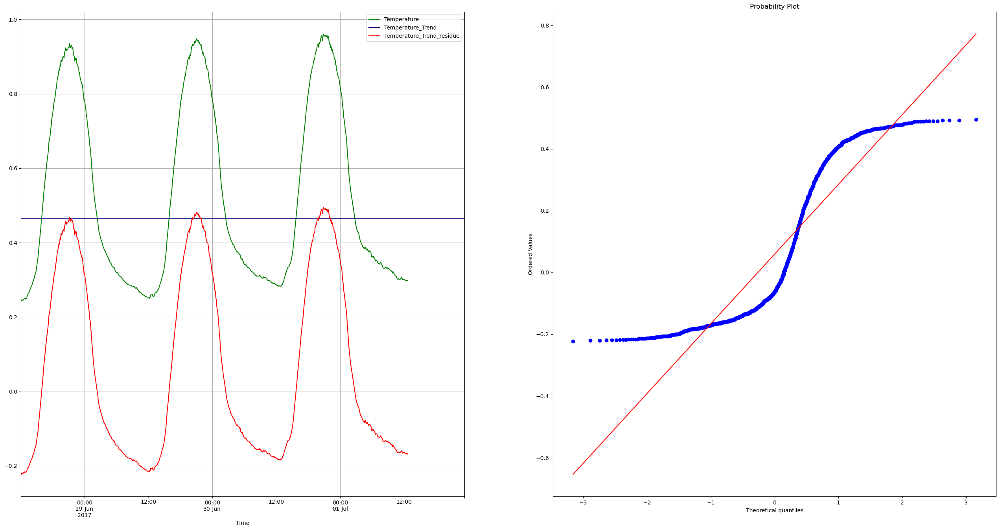

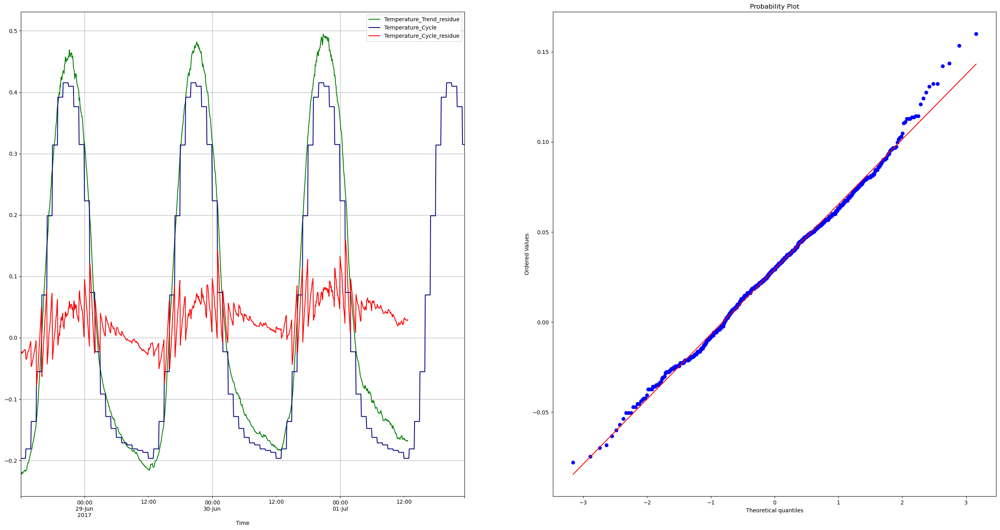

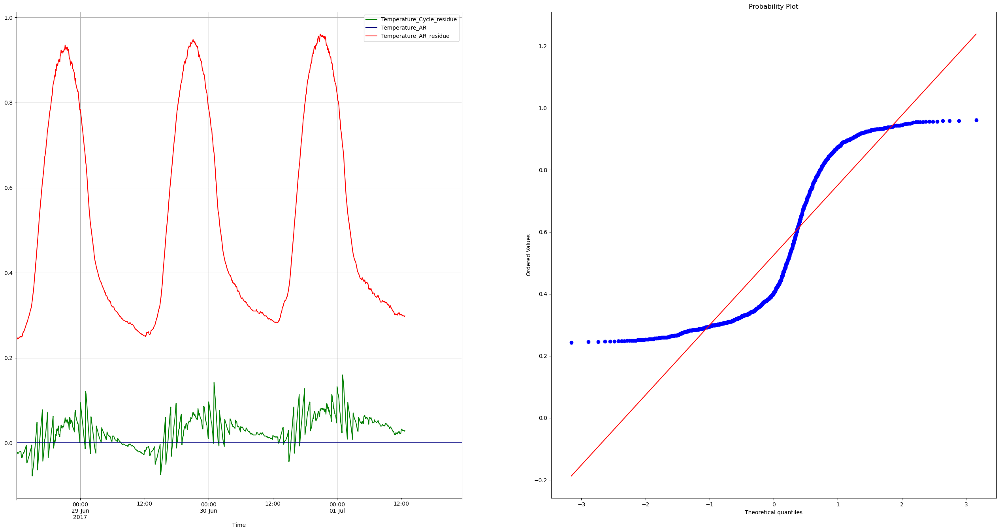

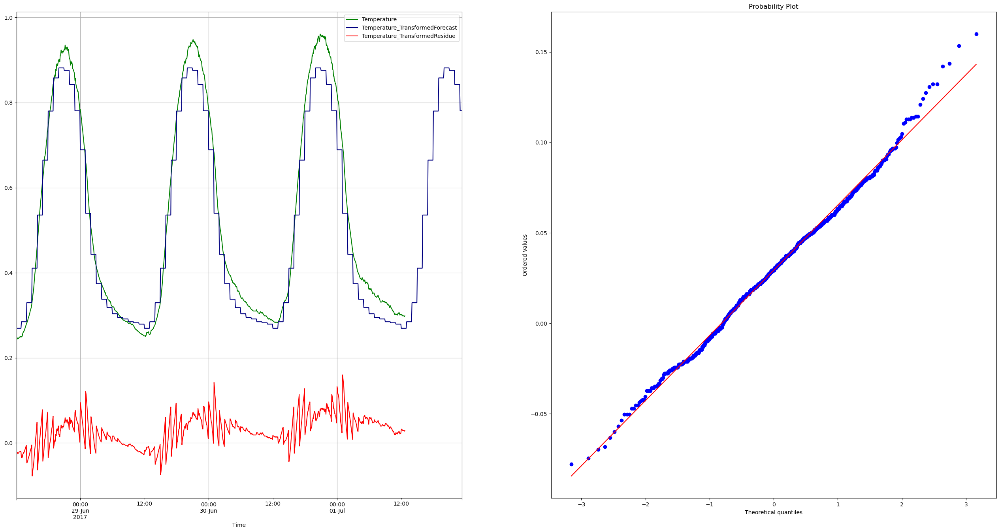

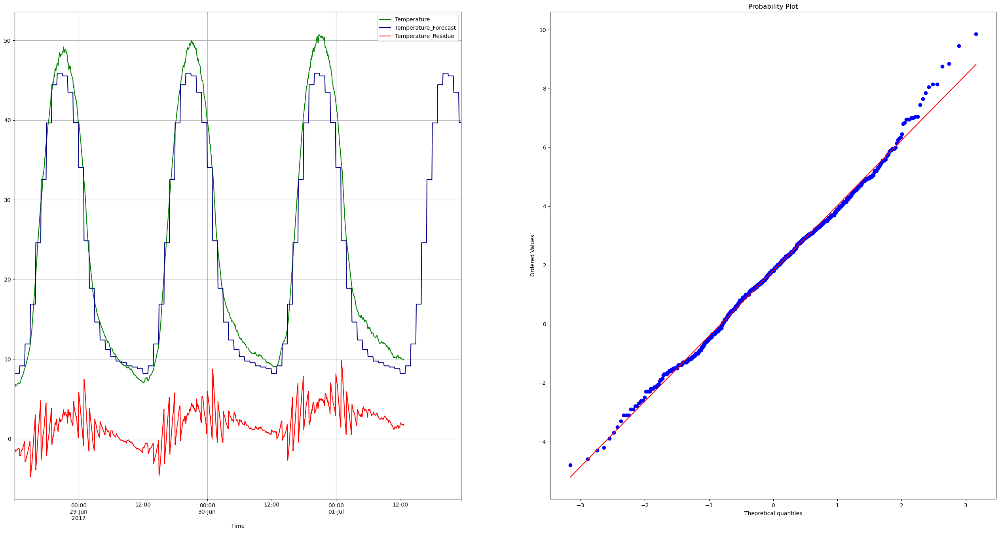

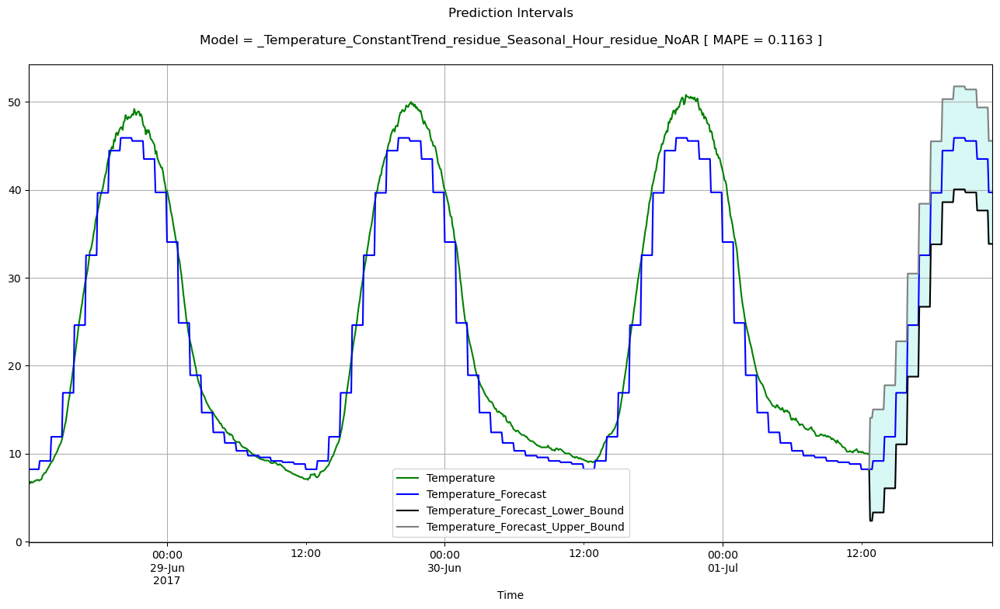

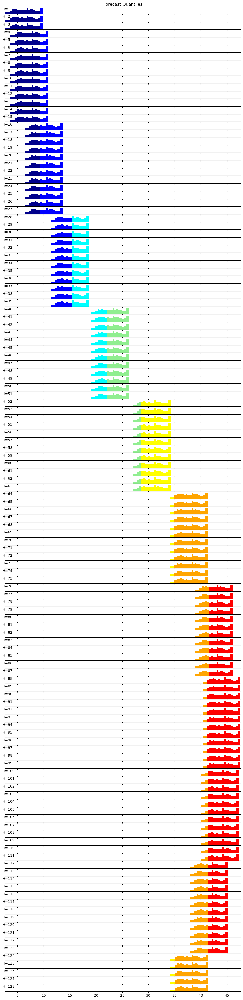

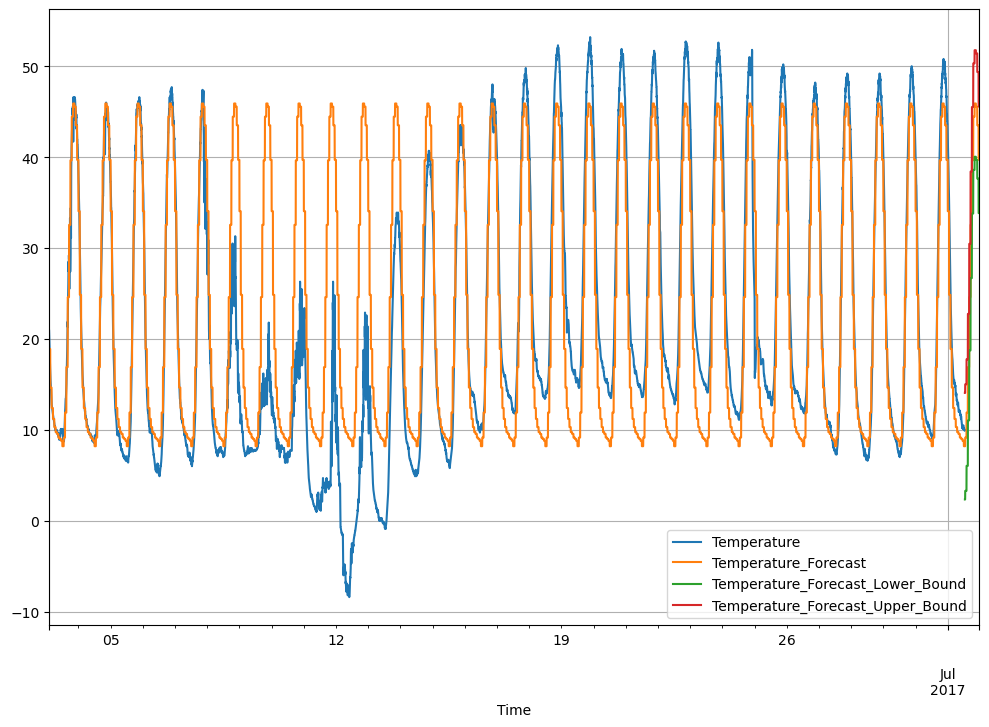

In [11]:
build_forecast_and_plot_model(128)

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 256}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:p

       Transformation DecompositionType  \
0        _Temperature             T+S+R   
1  CumSum_Temperature             T+S+R   

                                               Model      Voting Complexity  
0  _Temperature_ConstantTrend_residue_Seasonal_Ho...  14252.7461      SSSSS  
1  CumSum_Temperature_Lag1Trend_residue_Seasonal_...  14149.5781      MSSSS  


INFO:pyaf.timing:('OPERATION_END_ELAPSED', 15.01, ('UPDATE_BEST_MODEL_PERFS', {'Signal': 'Temperature', 'Model': '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR'}))
INFO:pyaf.timing:('OPERATION_START', ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 14.31, ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 31.012, ('FINALIZE_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', [('Temperature', 'None', 'CumSum_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', '_', 'T+S+R')])], 'Cores': 1}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 229.571, ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 256}}))
INFO:pyaf.std:TIME_DETAIL TimeVariable='Time' TimeMin=2017-06-03T02:05:00.000000 TimeMax=2017-06-25T03:00:00.000000 TimeDelta=<DateOffset: minutes=5> Ho

       Transformation DecompositionType  \
0        _Temperature             T+S+R   
1  CumSum_Temperature             T+S+R   

                                               Model      Voting Complexity  
0  _Temperature_ConstantTrend_residue_Seasonal_Ho...  14252.7461      SSSSS  
1  CumSum_Temperature_Lag1Trend_residue_Seasonal_...  14149.5781      MSSSS  


INFO:pyaf.timing:('OPERATION_END_ELAPSED', 19.448, ('PLOTTING', {'Signals': ['Temperature']}))
INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 256}))




<ModelInfo>
{
    "Temperature": {
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 256,
                "TimeMinMax": [
                    "2017-06-03 02:05:00",
                    "2017-07-01 12:40:00"
                ],
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "NoAR",
            "Best_Decomposition": "_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR",
            "Cycle": "Seasonal_Hour",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "ConstantTrend"
        },
        "Model_Performance": {
            "AUC": 0.5679,
            "COMPLEXITY": {
                "AR": "S",
                "Cycle": "S",
                "Decomposition": "S",
                "Transformation": "S",
                "Trend": "S"
            },
       

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 5.222, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 256}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized', '_Temperature',
       '_Temperature_ConstantTrend', '_Temperature_ConstantTrend_residue',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR_residue',
       'Temperature_Transformed', '_Temperature_Trend',
       '_Temperature_Trend_residue', '_Temperature_Cycle',
       '_Temperature_Cycle_residue', '_Temperature_AR',
       '_Temperature_AR_residue', '_Temperature_TransformedForecast',
       'Temperature_Forecast', '_Temperature_TransformedResidue',
       'Temperature_Residue', 'Temperature_Forecast_Lower_Bound',
       'Temperature_Forecast_Upper_Bound', 'Temperature_Forecast_Quantile_5',
       'Temperature_Forecast_Quantile_10', 'Temperature_Forecast_Quantile_15',
       'Temperature_

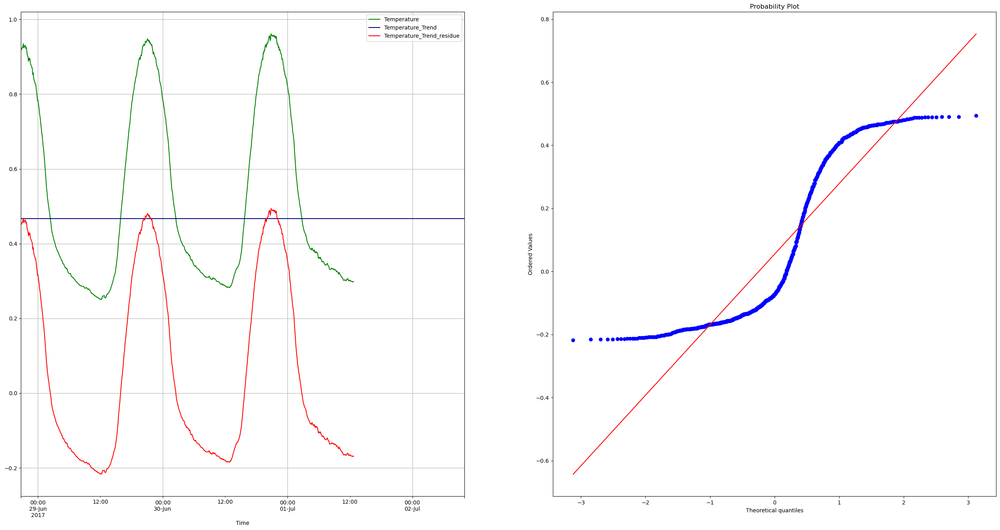

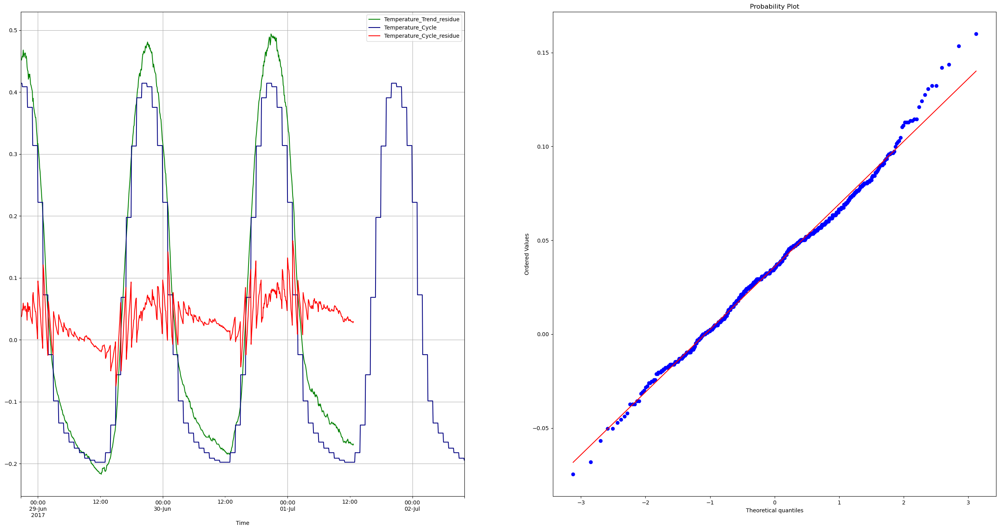

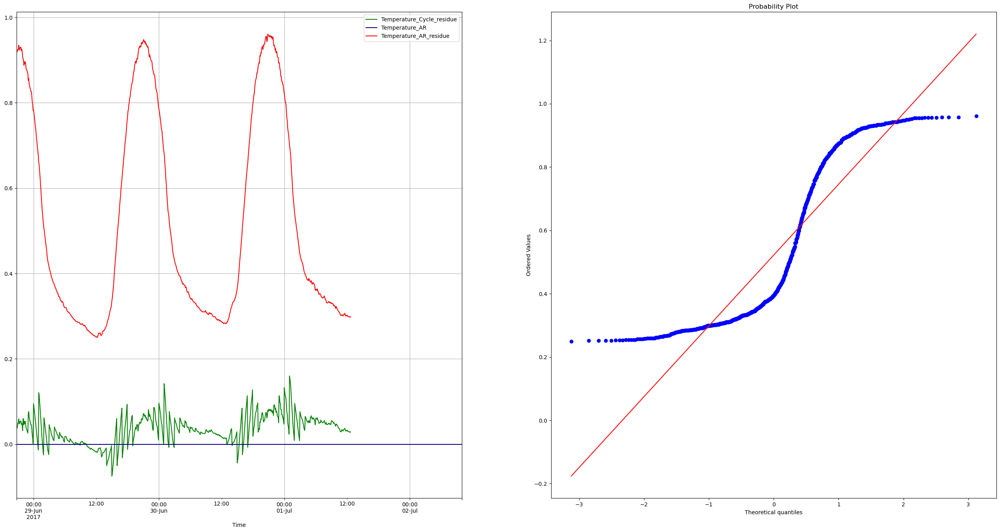

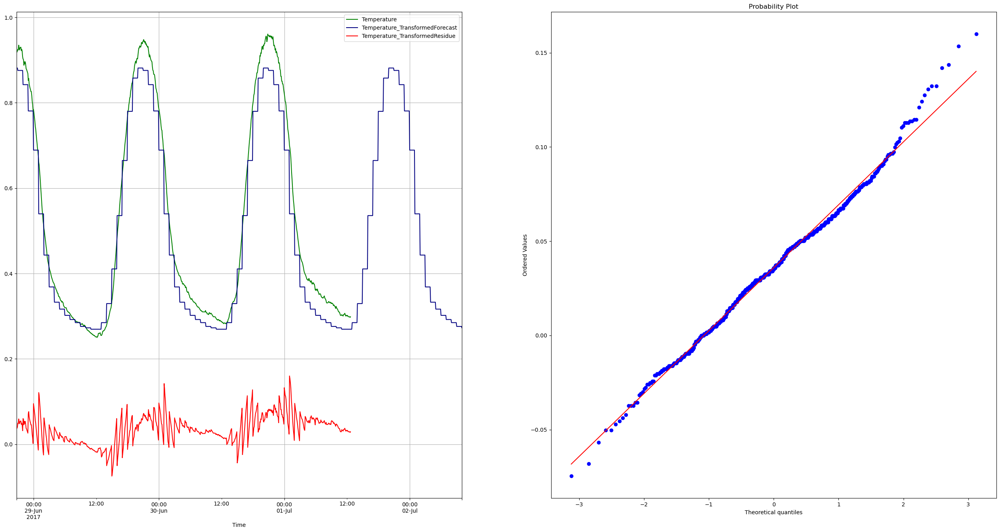

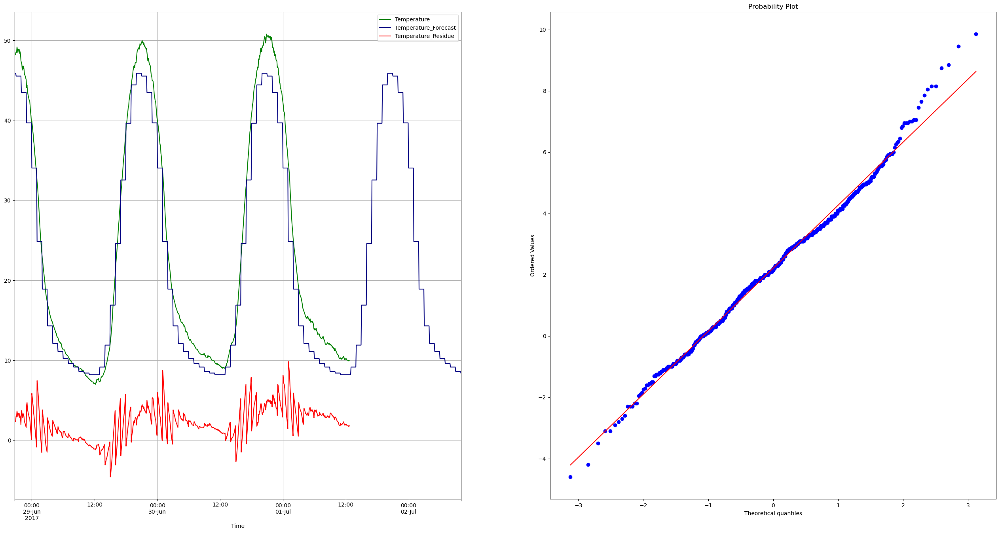

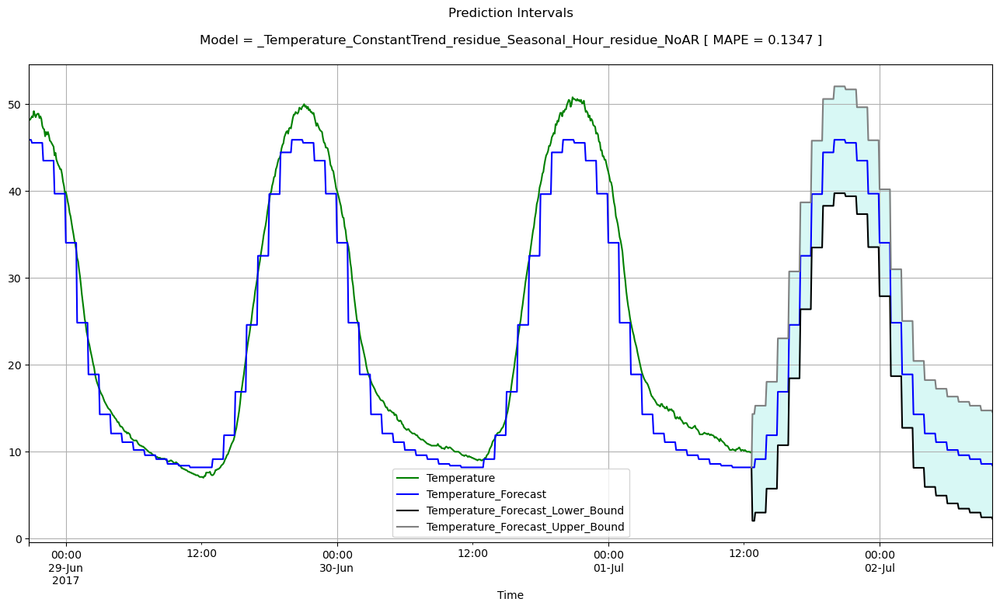

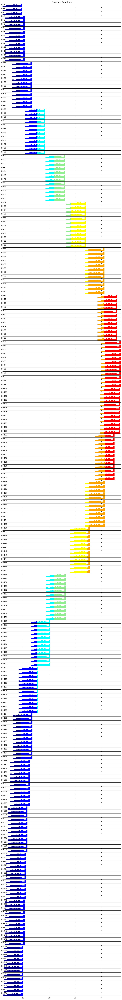

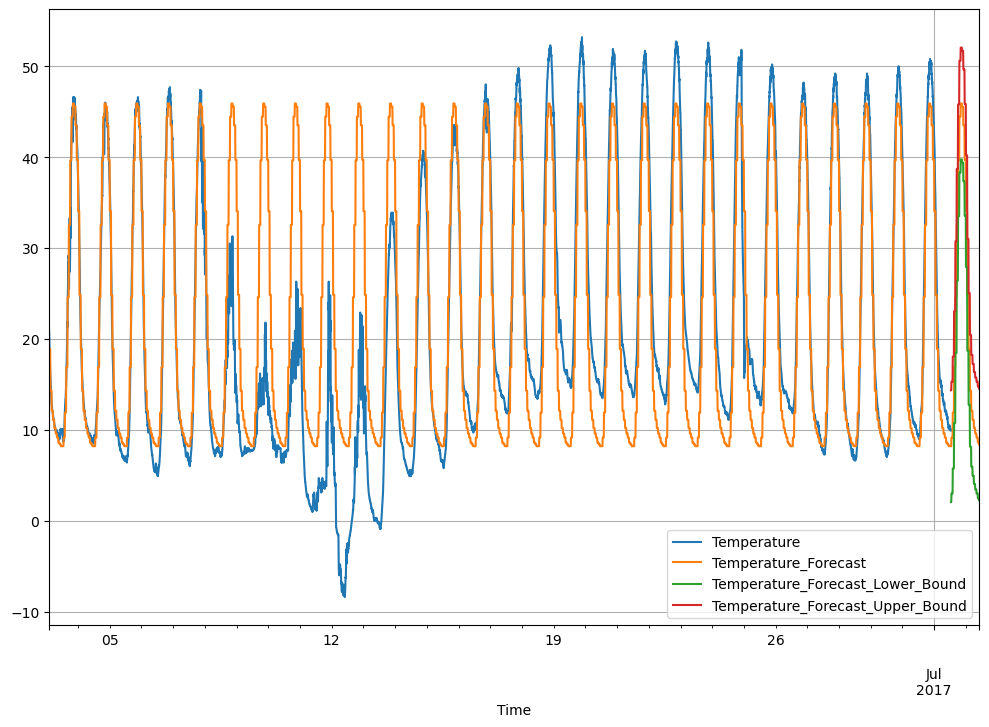

In [12]:
build_forecast_and_plot_model(256)

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 512}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:p

     Transformation DecompositionType  \
0      _Temperature             T+S+R   
1  Diff_Temperature             T+S+R   

                                               Model      Voting Complexity  
0  _Temperature_ConstantTrend_residue_Seasonal_Ho...  31505.3066      SSSSS  
1  Diff_Temperature_LinearTrend_residue_Seasonal_...  31488.0117      LMSSS  


INFO:pyaf.timing:('OPERATION_END_ELAPSED', 28.154, ('UPDATE_BEST_MODEL_PERFS', {'Signal': 'Temperature', 'Model': '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR'}))
INFO:pyaf.timing:('OPERATION_START', ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 27.722, ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 59.826, ('FINALIZE_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', [('Temperature', 'None', 'CumSum_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', '_', 'T+S+R')])], 'Cores': 1}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 446.388, ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 512}}))
INFO:pyaf.std:TIME_DETAIL TimeVariable='Time' TimeMin=2017-06-03T02:05:00.000000 TimeMax=2017-06-24T10:00:00.000000 TimeDelta=<DateOffset: minutes=5> 

     Transformation DecompositionType  \
0      _Temperature             T+S+R   
1  Diff_Temperature             T+S+R   

                                               Model      Voting Complexity  
0  _Temperature_ConstantTrend_residue_Seasonal_Ho...  31505.3066      SSSSS  
1  Diff_Temperature_LinearTrend_residue_Seasonal_...  31488.0117      LMSSS  


INFO:pyaf.timing:('OPERATION_END_ELAPSED', 35.766, ('PLOTTING', {'Signals': ['Temperature']}))
INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 512}))




<ModelInfo>
{
    "Temperature": {
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 512,
                "TimeMinMax": [
                    "2017-06-03 02:05:00",
                    "2017-07-01 12:40:00"
                ],
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "NoAR",
            "Best_Decomposition": "_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR",
            "Cycle": "Seasonal_Hour",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "ConstantTrend"
        },
        "Model_Performance": {
            "AUC": 0.5694,
            "COMPLEXITY": {
                "AR": "S",
                "Cycle": "S",
                "Decomposition": "S",
                "Transformation": "S",
                "Trend": "S"
            },
       

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 9.628, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 512}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized', '_Temperature',
       '_Temperature_ConstantTrend', '_Temperature_ConstantTrend_residue',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR',
       '_Temperature_ConstantTrend_residue_Seasonal_Hour_residue_NoAR_residue',
       'Temperature_Transformed', '_Temperature_Trend',
       '_Temperature_Trend_residue', '_Temperature_Cycle',
       '_Temperature_Cycle_residue', '_Temperature_AR',
       '_Temperature_AR_residue', '_Temperature_TransformedForecast',
       'Temperature_Forecast', '_Temperature_TransformedResidue',
       'Temperature_Residue', 'Temperature_Forecast_Lower_Bound',
       'Temperature_Forecast_Upper_Bound', 'Temperature_Forecast_Quantile_5',
       'Temperature_Forecast_Quantile_10', 'Temperature_Forecast_Quantile_15',
       'Temperature_

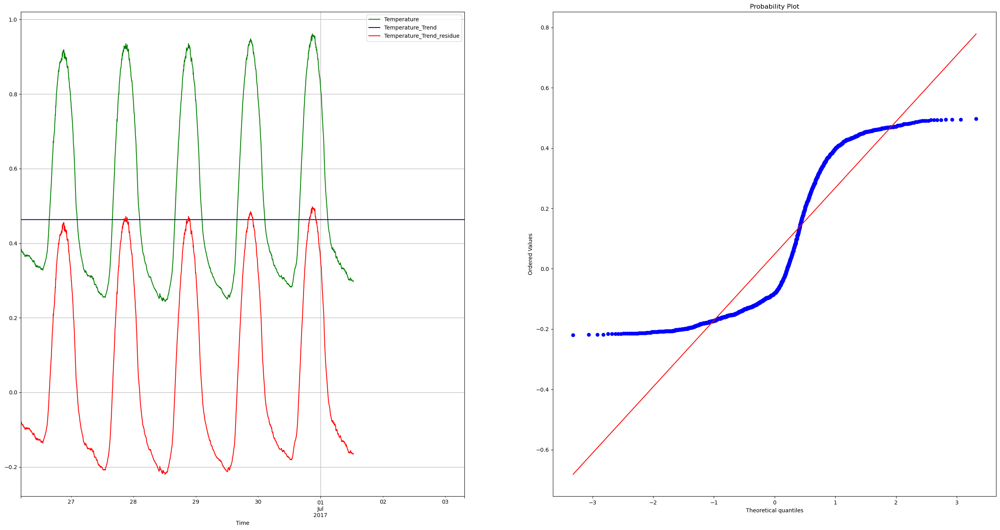

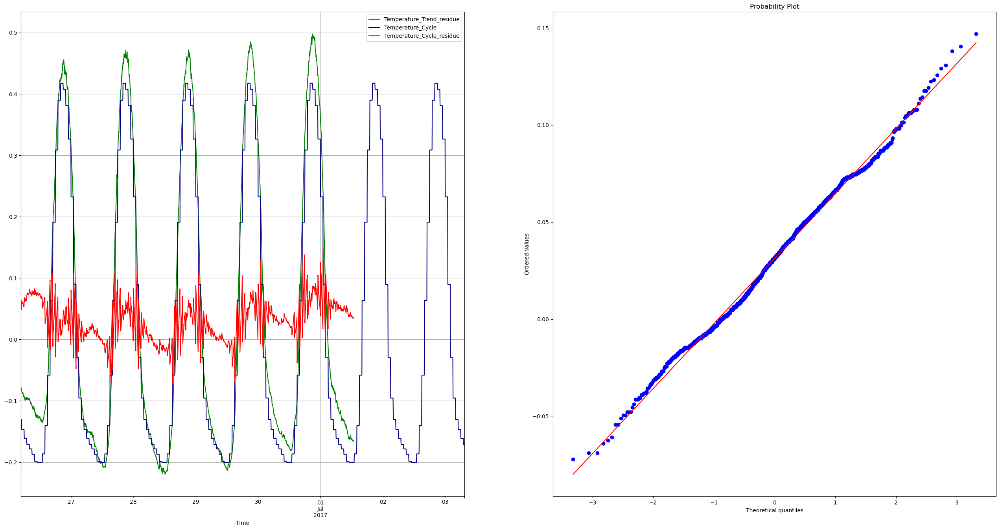

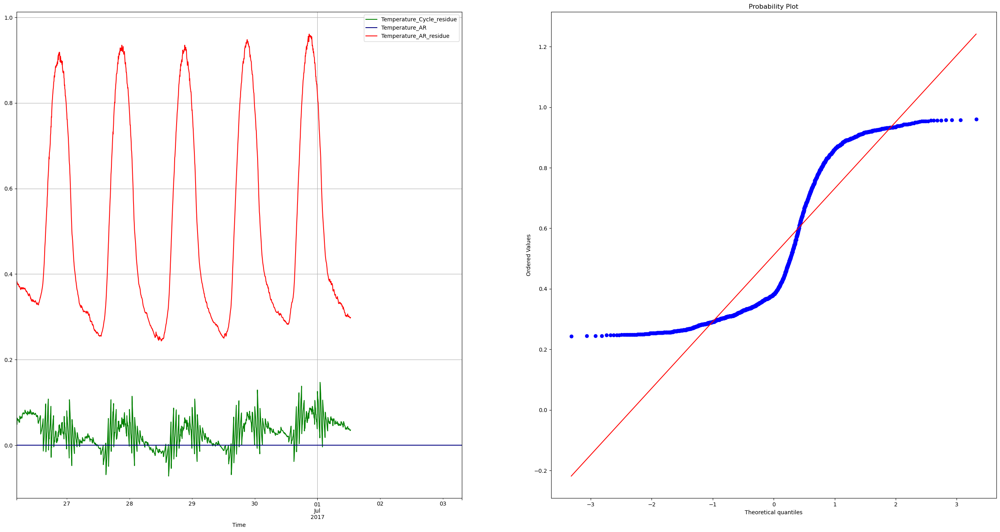

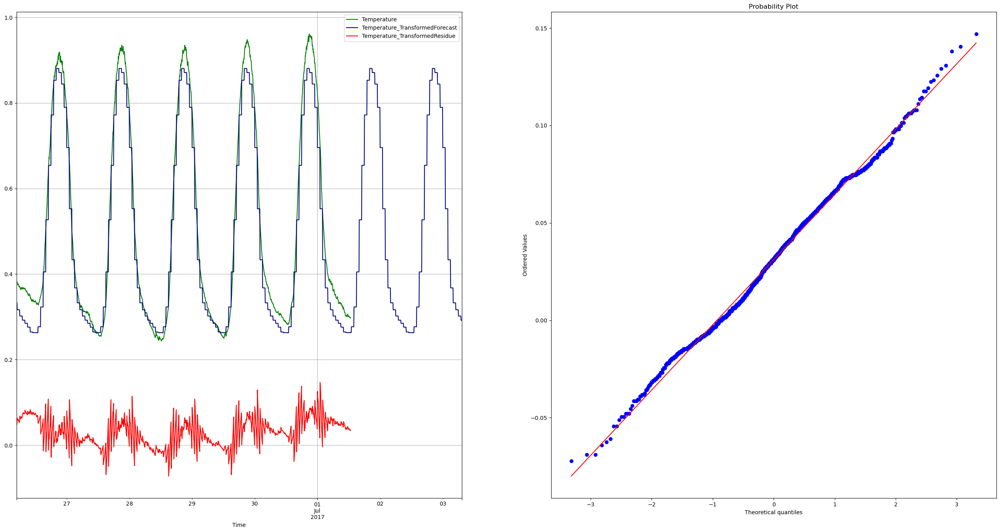

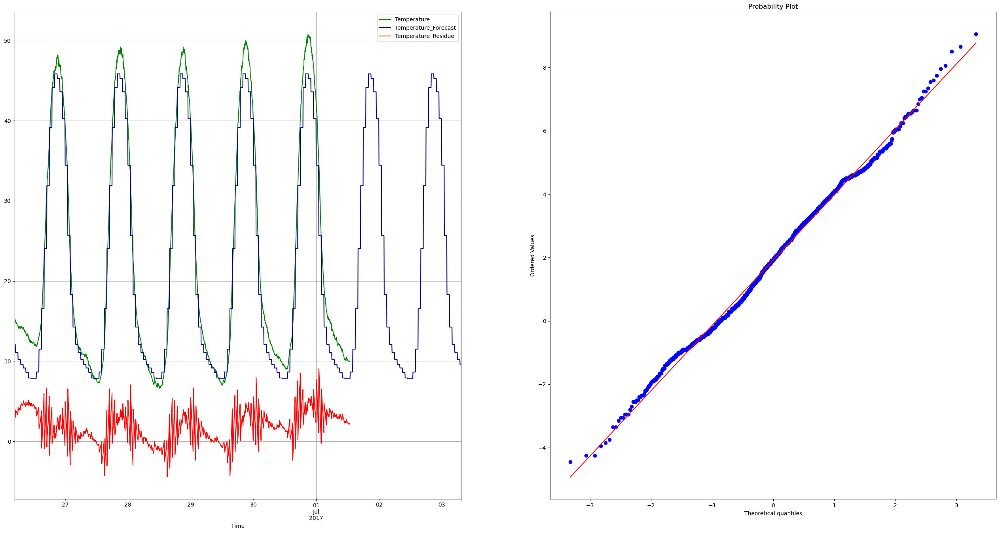

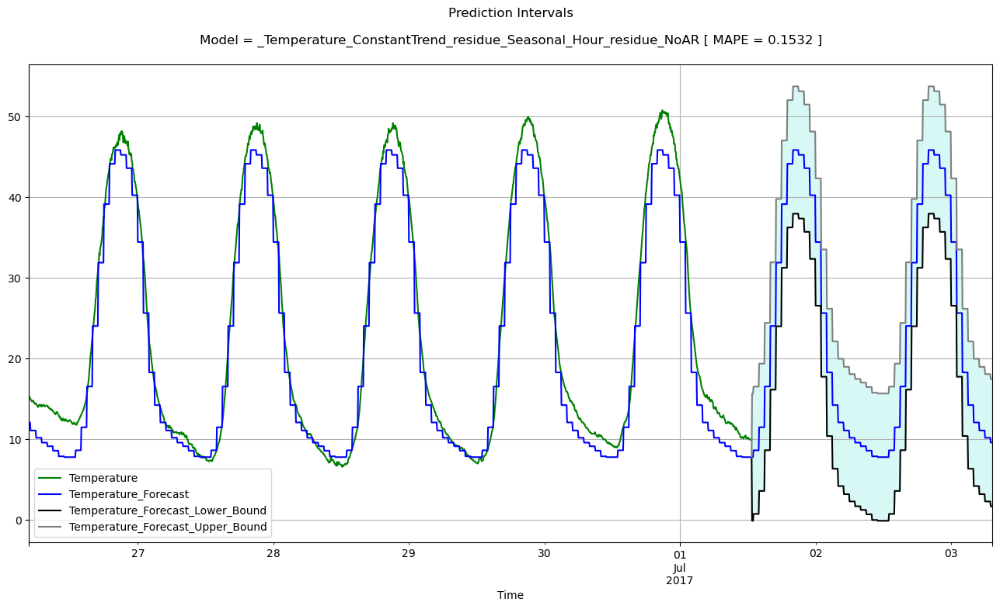

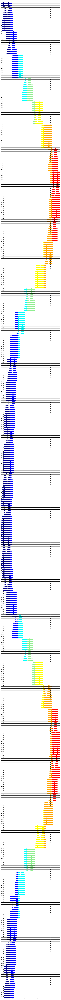

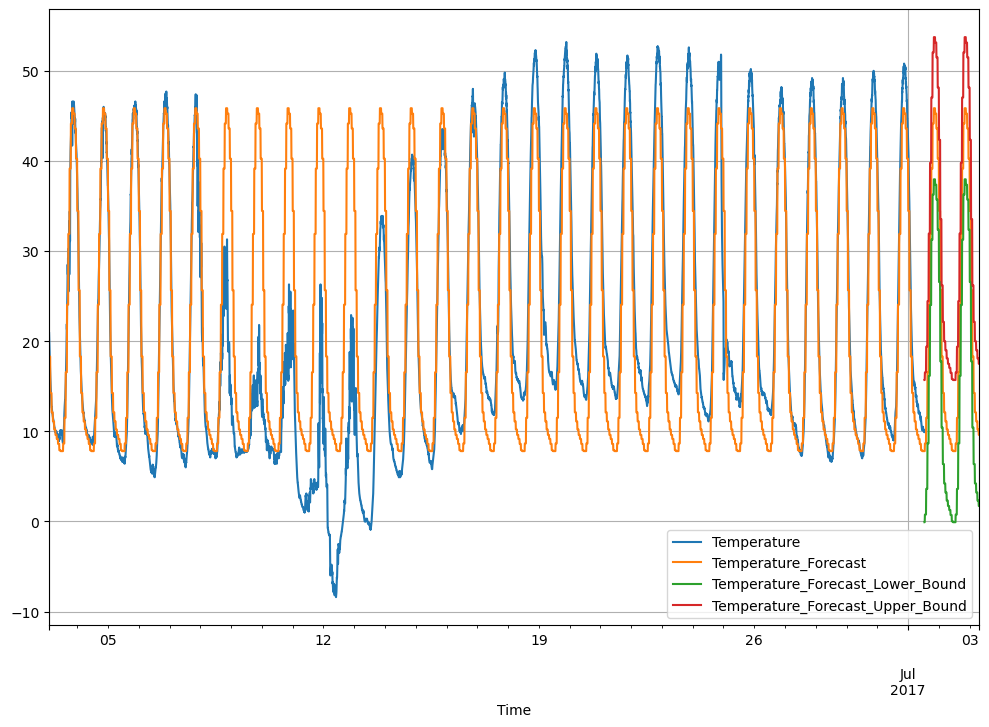

In [13]:
build_forecast_and_plot_model(512)

INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 1024}}))
INFO:pyaf.timing:('OPERATION_START', ('SIGNAL_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', 'None', '_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', 'CumSum_', 'T+S+R')], 'Cores': 4}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': '_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'Diff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'RelDiff_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:pyaf.timing:('OPERATION_START', ('TRAINING', {'Signal': 'Temperature', 'Transformation': 'CumSum_Temperature', 'DecompositionType': 'T+S+R'}))
INFO:

       Transformation DecompositionType  \
1        _Temperature             T+S+R   
0  CumSum_Temperature             T+S+R   

                                               Model      Voting Complexity  
1  _Temperature_Lag1Trend_residue_Seasonal_Hour_r...  59630.8008      SSSSS  
0  CumSum_Temperature_Lag1Trend_residue_Seasonal_...  59895.7236      MSSSS  


INFO:pyaf.timing:('OPERATION_END_ELAPSED', 59.824, ('UPDATE_BEST_MODEL_PERFS', {'Signal': 'Temperature', 'Model': '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR'}))
INFO:pyaf.timing:('OPERATION_START', ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 60.055, ('COMPUTE_PREDICTION_INTERVALS', {'Signal': 'Temperature'}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 128.713, ('FINALIZE_TRAINING', {'Signals': ['Temperature'], 'Transformations': [('Temperature', [('Temperature', 'None', 'CumSum_', 'T+S+R'), ('Temperature', 'None', 'Diff_', 'T+S+R'), ('Temperature', 'None', 'RelDiff_', 'T+S+R'), ('Temperature', 'None', '_', 'T+S+R')])], 'Cores': 1}))
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 916.938, ('TRAINING', {'Signals': ['Temperature'], 'Horizons': {'Temperature': 1024}}))
INFO:pyaf.std:TIME_DETAIL TimeVariable='Time' TimeMin=2017-06-03T02:05:00.000000 TimeMax=2017-06-22T23:50:00.000000 TimeDelta=<DateOffset: minutes=5> Ho

       Transformation DecompositionType  \
1        _Temperature             T+S+R   
0  CumSum_Temperature             T+S+R   

                                               Model      Voting Complexity  
1  _Temperature_Lag1Trend_residue_Seasonal_Hour_r...  59630.8008      SSSSS  
0  CumSum_Temperature_Lag1Trend_residue_Seasonal_...  59895.7236      MSSSS  


/usr/lib/python3/dist-packages/numpy/lib/histograms.py:883: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
INFO:pyaf.timing:('OPERATION_END_ELAPSED', 75.768, ('PLOTTING', {'Signals': ['Temperature']}))
INFO:pyaf.timing:('OPERATION_START', ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 1024}))




<ModelInfo>
{
    "Temperature": {
        "Dataset": {
            "Signal": "Temperature",
            "Time": {
                "Horizon": 1024,
                "TimeMinMax": [
                    "2017-06-03 02:05:00",
                    "2017-07-01 12:40:00"
                ],
                "TimeVariable": "Time"
            },
            "Training_Signal_Length": 8192
        },
        "Model": {
            "AR_Model": "NoAR",
            "Best_Decomposition": "_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR",
            "Cycle": "Seasonal_Hour",
            "Signal_Decomposition_Type": "T+S+R",
            "Signal_Transoformation": "NoTransf",
            "Trend": "Lag1Trend"
        },
        "Model_Performance": {
            "AUC": 0.388,
            "COMPLEXITY": {
                "AR": "S",
                "Cycle": "S",
                "Decomposition": "S",
                "Transformation": "S",
                "Trend": "S"
            },
            "CR

INFO:pyaf.timing:('OPERATION_END_ELAPSED', 19.911, ('FORECASTING', {'Signals': ['Temperature'], 'Horizon': 1024}))


Forecast Columns  Index(['Time', 'Temperature', 'row_number', 'Time_Normalized', '_Temperature',
       '_Temperature_Lag1Trend', '_Temperature_Lag1Trend_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR',
       '_Temperature_Lag1Trend_residue_Seasonal_Hour_residue_NoAR_residue',
       'Temperature_Transformed', '_Temperature_Trend',
       '_Temperature_Trend_residue', '_Temperature_Cycle',
       '_Temperature_Cycle_residue', '_Temperature_AR',
       '_Temperature_AR_residue', '_Temperature_TransformedForecast',
       'Temperature_Forecast', '_Temperature_TransformedResidue',
       'Temperature_Residue', 'Temperature_Forecast_Lower_Bound',
       'Temperature_Forecast_Upper_Bound', 'Temperature_Forecast_Quantile_5',
       'Temperature_Forecast_Quantile_10', 'Temperature_Forecast_Quantile_15',
       'Temperature_Forecast_Quantile_20', '

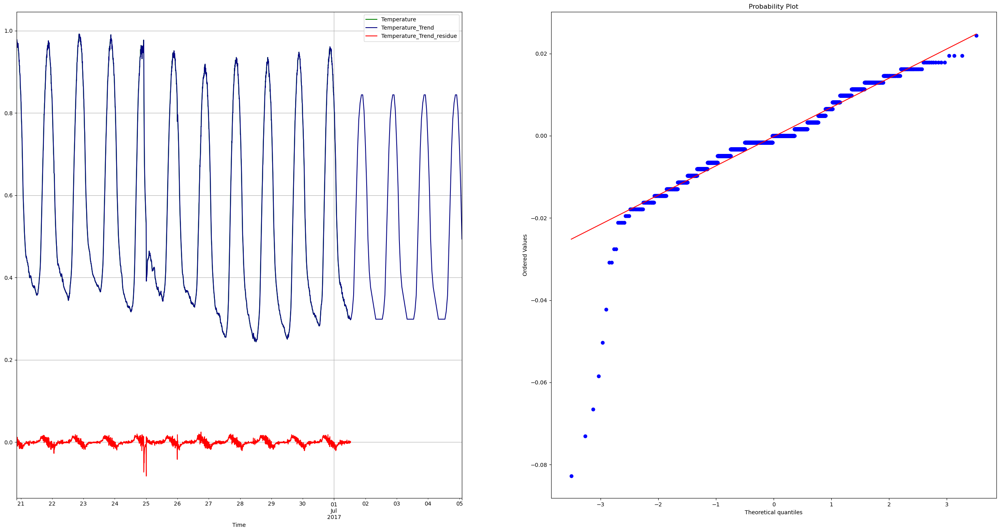

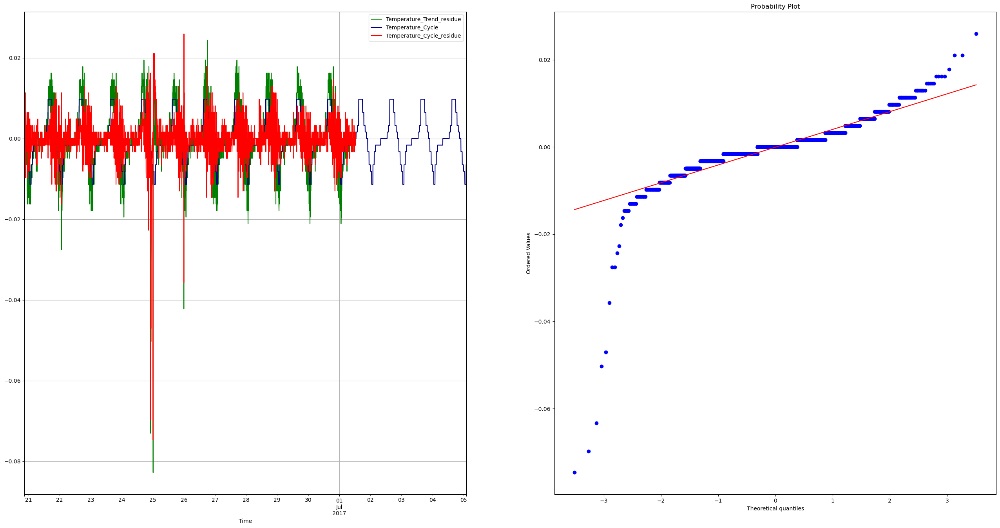

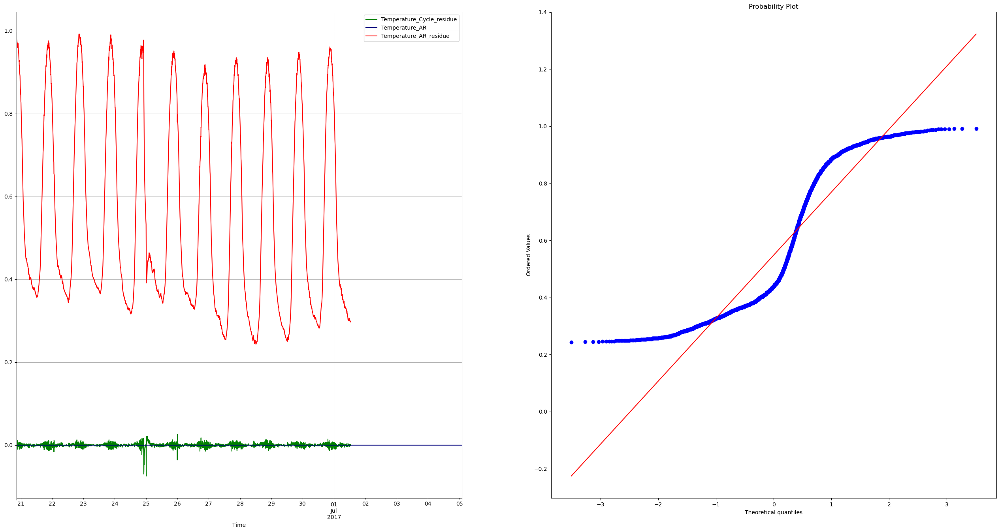

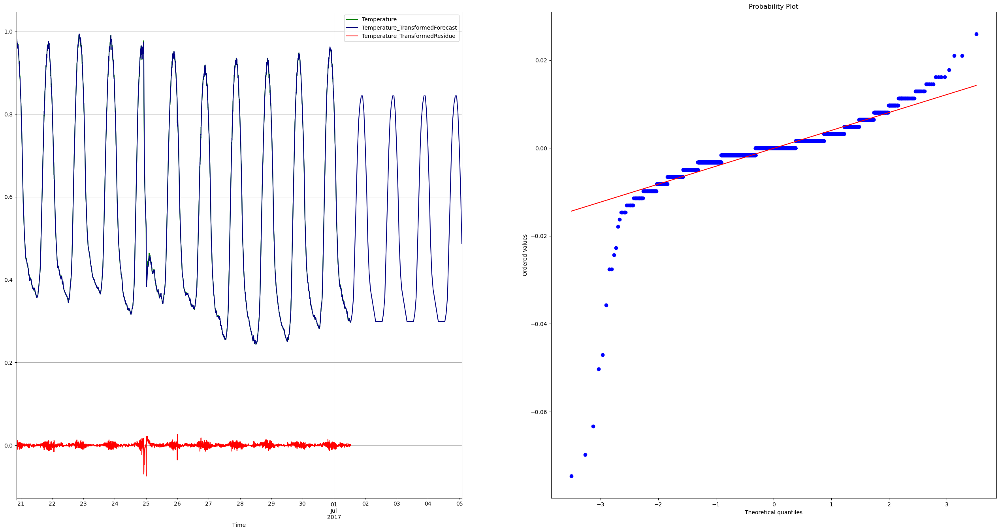

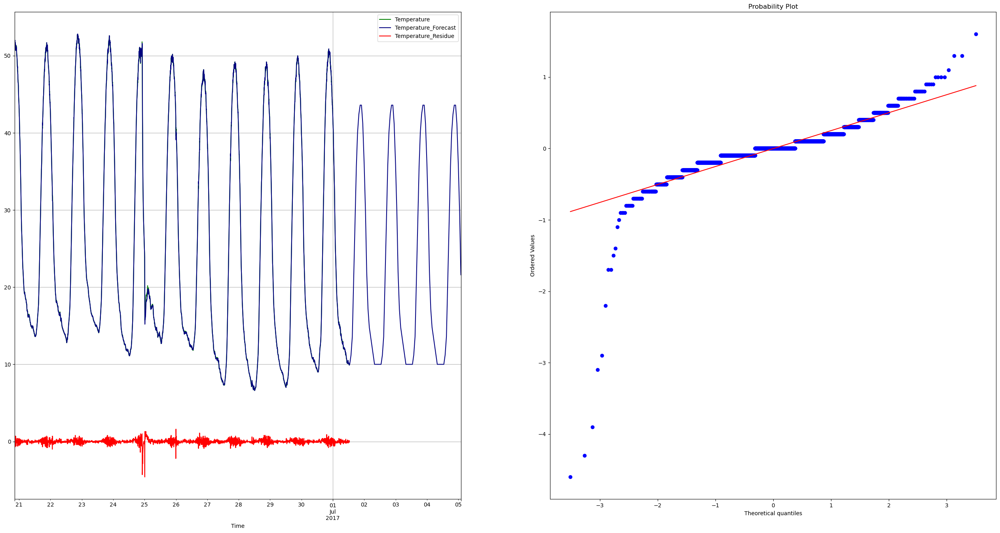

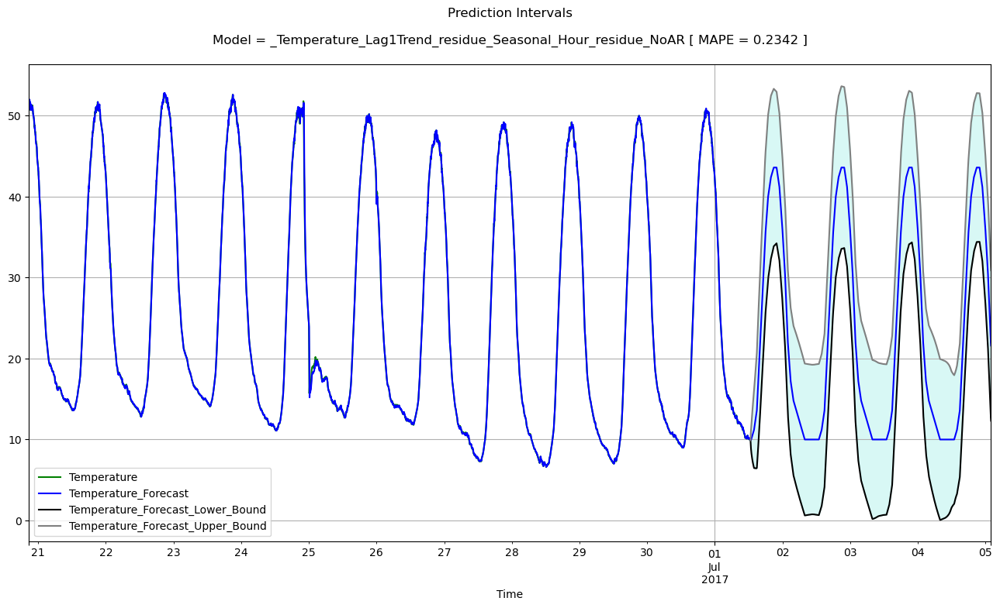

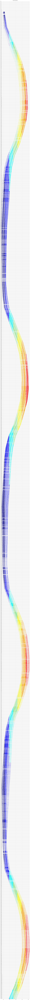

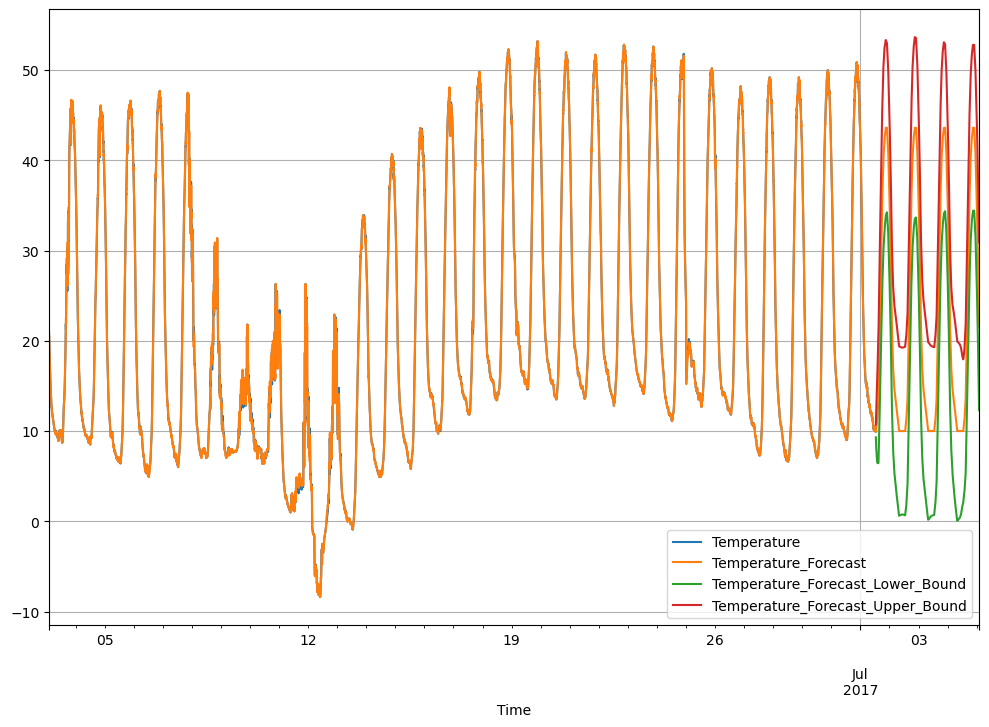

In [14]:
build_forecast_and_plot_model(1024)